<a href="https://colab.research.google.com/github/RevekkaKyriakoglou/Frequences/blob/master/Dataset_Builder.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Be aware of the language, not just limit to English

IDEAS:
- how about add year information, like lots of keywords may link to the latest terminologies, which have strong connection with time and area
- how about using the same method in building sentimental lexicons
- think about how human does these work, how math does, how machine does

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/COURSE/Intern

/content/drive/MyDrive/COURSE/Intern


In [ ]:
try:
    %load_ext autotime
except:
    !pip install ipython-autotime
    %load_ext autotime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 230 µs (started: 2022-06-13 08:02:40 +00:00)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from collections import Counter
from nltk.tokenize import word_tokenize
from tqdm.notebook import tqdm
from wordcloud import WordCloud
import re

time: 1.69 s (started: 2022-06-13 08:02:40 +00:00)


## 1. Import Dataset

In [ ]:
import pickle

with open('/content/drive/MyDrive/COURSE/Intern/corpus_v3_per_company_25_04_2021.pkl', 'rb') as f:
    df = pickle.load(f)
df

,Nb_company,Company,Sector,Text_para
Firmreg_id,,,,
F_AT000060,686,AMS AG,Industrial Electric and Electronic Machinery,"Born in the Netherlands, Wim received a PhD i..."
F_AT000087,439,AT&S AUSTRIA TECHNOLOGIE & SYSTEMTECHNIK AG,Industrial Electric and Electronic Machinery,The core development sector Functionality Inte...
F_AT000135,551,BDI BETEILIGUNGS GMBH,Business Services,We stand for excellence in the conceptual des...
F_AT000149,546,PLANSEE HOLDING AG,Metals and Metal Products,". In , the winning projects in the categories ..."
F_AT000189,407,LENZING AG,Chemicals Petroleum Rubber and Plastic,From producing fibers made from wood to becomi...
...,...,...,...,...
F_US001076,221,"MEDIDATA SOLUTIONS, INC.",Industrial Electric and Electronic Machinery,Data integration feeds the med device innovati...
F_US001079,787,FMC CORP,Chemicals Petroleum Rubber and Plastic,FMC s technology organization is driven by a s...
F_VG000003,673,NOMAD FOODS LIMITED,Food and Tobacco Manufacturing,We combine our global scale and local proximit...


time: 742 ms (started: 2022-06-13 08:02:41 +00:00)


In [ ]:
len(df['Text_para'].iloc[0].split(' '))

539

time: 16.2 ms (started: 2022-05-19 14:02:29 +00:00)


In [ ]:
len(df['Text_para'].iloc[2].split(' '))

270

time: 11.6 ms (started: 2022-05-19 14:02:20 +00:00)


 We stand for excellence in the conceptual design and implementation of projects.bioCRACK, an innovative, patented process for obtaining a second-generation biofuel, enables refineries to achieve a biogenic content of up to 20 percent in standard-compliant diesel fuel. This result is achieved by the simultaneous processing of a refinery by-product and solid biomass (e.g. straw, waste wood, etc.).The potential of algae as a renewable source for the production of high-quality products for the pharmaceutical, cosmetics and food industry has encouraged us to develop a completely new process for algae cultivation. Thanks to special photobioreactors, the process is independent of climatic conditions and environmental influences and can therefore be used throughout the year with a consistently high production output. This process development has resulted in a spin-off company, In the BioFuels research area, we focus on both the processing of by-products and waste materials from industry and meeting the constantly increasing quality requirements for BioDiesel. , Research and development activities are fundamental for us in order to continue setting standards in special plant construction with our own technologies. Therefore, we invest a significant proportion of our annual turnover in future-oriented research and development (R&D).For many years, we have successfully cooperated with external institutes and universities in the basic research phase, so that we can rely on their analytical and experimental support.An important basic requirement for the risk-free industrial implementation of research results is their validation in our own testing facility. We are a renowned specialist for the scale-up of process concepts, from laboratory tests to industrial plants. Through competent support in contract research, customers benefit from our expertise in project development.

## 2. Statistics on Dataset

### 2.1 Check the basic information about the dataset, its columns, data type, numbers and so on.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 924 entries, F_AT000060 to F_ZA000005
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Nb_company  924 non-null    int64 
 1   Company     924 non-null    object
 2   Sector      924 non-null    object
 3   Text_para   924 non-null    object
dtypes: int64(1), object(3)
memory usage: 36.1+ KB
time: 20 ms (started: 2022-05-09 11:33:48 +00:00)


In [ ]:
df.isna().sum()

Nb_company    0
Company       0
Sector        0
Text_para     0
dtype: int64

time: 13.3 ms (started: 2022-05-09 11:33:48 +00:00)


### 2.2 To see the length of the text of each company

In [ ]:
df['length'] = df['Text_para'].str.len()
df.describe()

,Nb_company,length
count,924.000000,9.240000e+02
mean,479.011905,2.855908e+04
std,276.245876,1.445890e+05
min,1.000000,3.800000e+01
25%,239.750000,1.405750e+03
50%,482.500000,3.585500e+03
75%,719.250000,1.120000e+04
max,953.000000,1.807988e+06


time: 21.1 ms (started: 2022-05-09 11:33:48 +00:00)


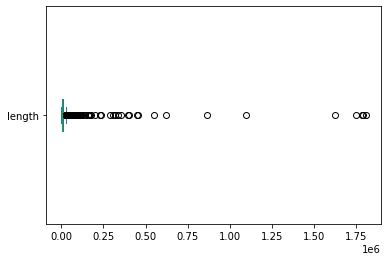

time: 194 ms (started: 2022-05-09 11:33:48 +00:00)


In [ ]:
df['length'].plot(kind='box', vert=False)

It seems most of the companies have short length in description and few of them are extremely long. I am not sure whether this is a biased dataset, we need to see whether length is a potential factor that has an impact on our task.

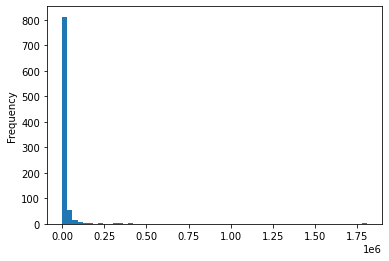

time: 331 ms (started: 2022-05-09 11:33:48 +00:00)


In [ ]:
df['length'].plot(kind='hist', bins=60)

In [ ]:
print(f"Text Length (original):  {df['length'].count()}")
print(f"Text Length <= 200000:   {df[df['length']<=200000]['length'].count()}")
print(f"Text Length <= 100000:   {df[df['length']<=100000]['length'].count()}")
print(f"Text Length <= 50000:    {df[df['length']<=50000]['length'].count()}")

Text Length (original):  924
Text Length <= 200000:   903
Text Length <= 100000:   888
Text Length <= 50000:    860
time: 10.8 ms (started: 2022-05-09 11:33:49 +00:00)


### 2.3 To see the distribution of the sectors

In [ ]:
df.groupby(['Sector'])['Company'].count().reset_index(name='Count').sort_values(['Count'], ascending=False)

,Sector,Count
10,Industrial Electric and Electronic Machinery,201
4,Chemicals Petroleum Rubber and Plastic,197
3,Business Services,111
22,Transport Manufacturing,48
7,Computer Software,45
5,Communications,40
9,Food and Tobacco Manufacturing,32
13,Metals and Metal Products,30
2,Biotechnology and Life Sciences,30
1,Banking Insurance and Financial Services,27


time: 18.4 ms (started: 2022-05-09 11:33:49 +00:00)


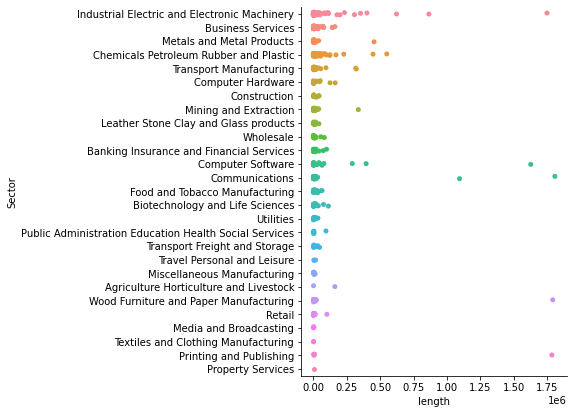

time: 792 ms (started: 2022-05-09 11:33:49 +00:00)


In [ ]:
g = sns.catplot(data=df, x="length", y="Sector")
# Change seaborn plot size
g.fig.set_figwidth(30)
g.fig.set_figheight(6)

Redo this part after remove the outliers

### 2.4 Tokenization

In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

time: 658 ms (started: 2022-05-09 11:33:50 +00:00)


In [ ]:
df['tokens'] = df['Text_para'].map(word_tokenize)
df['num_tokens'] = df['tokens'].map(len)

time: 40.7 s (started: 2022-05-09 11:33:50 +00:00)


In [ ]:
df

,Nb_company,Company,Sector,Text_para,length,tokens,num_tokens
Firmreg_id,,,,,,,
F_AT000060,686,AMS AG,Industrial Electric and Electronic Machinery,"Born in the Netherlands, Wim received a PhD i...",3585,"[Born, in, the, Netherlands, ,, Wim, received,...",613
F_AT000087,439,AT&S AUSTRIA TECHNOLOGIE & SYSTEMTECHNIK AG,Industrial Electric and Electronic Machinery,The core development sector Functionality Inte...,9208,"[The, core, development, sector, Functionality...",1531
F_AT000135,551,BDI BETEILIGUNGS GMBH,Business Services,We stand for excellence in the conceptual des...,1892,"[We, stand, for, excellence, in, the, conceptu...",301
F_AT000149,546,PLANSEE HOLDING AG,Metals and Metal Products,". In , the winning projects in the categories ...",1887,"[., In, ,, the, winning, projects, in, the, ca...",312
F_AT000189,407,LENZING AG,Chemicals Petroleum Rubber and Plastic,From producing fibers made from wood to becomi...,11434,"[From, producing, fibers, made, from, wood, to...",1921
...,...,...,...,...,...,...,...
F_US001076,221,"MEDIDATA SOLUTIONS, INC.",Industrial Electric and Electronic Machinery,Data integration feeds the med device innovati...,6852,"[Data, integration, feeds, the, med, device, i...",1045
F_US001079,787,FMC CORP,Chemicals Petroleum Rubber and Plastic,FMC s technology organization is driven by a s...,5989,"[FMC, s, technology, organization, is, driven,...",992
F_VG000003,673,NOMAD FOODS LIMITED,Food and Tobacco Manufacturing,We combine our global scale and local proximit...,611,"[We, combine, our, global, scale, and, local, ...",102


time: 29.6 ms (started: 2022-05-09 11:34:31 +00:00)


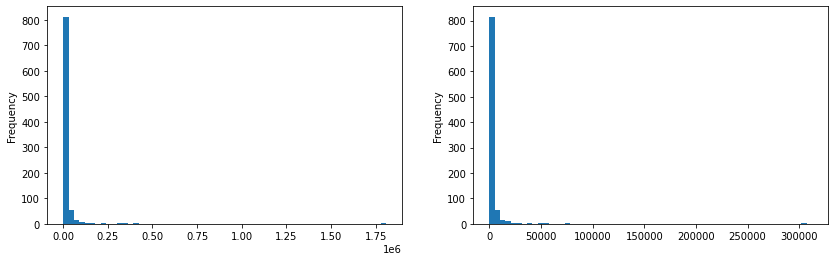

time: 589 ms (started: 2022-05-09 11:34:31 +00:00)


In [ ]:
plt.figure(figsize=[14, 4])
plt.subplot(1, 2, 1)
df['length'].plot(kind='hist', bins=60)
plt.subplot(1, 2, 2)
df['num_tokens'].plot(kind='hist', bins=60)

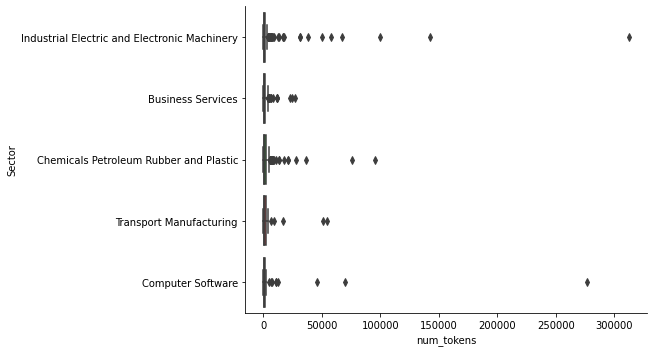

time: 347 ms (started: 2022-05-09 11:34:32 +00:00)


In [ ]:
where = df['Sector'].isin(['Industrial Electric and Electronic Machinery', 
                           'Chemicals Petroleum Rubber and Plastic', 
                           'Business Services', 
                           'Transport Manufacturing', 
                           'Computer Software'])
g = sns.catplot(data=df[where], x="num_tokens", y="Sector", kind='box')
g.fig.set_figwidth(20)

### 2.5 Try to remove the outliers 

In [ ]:
# original: 924
df[df['length']<=100000].count()

Nb_company    888
Company       888
Sector        888
Text_para     888
length        888
tokens        888
num_tokens    888
dtype: int64

time: 12.7 ms (started: 2022-05-09 11:34:32 +00:00)


In [ ]:
df_filter = df[df['length']<=100000]

time: 2.95 ms (started: 2022-05-09 11:34:32 +00:00)


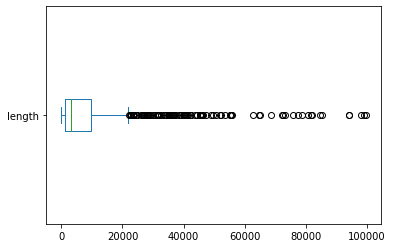

time: 147 ms (started: 2022-05-09 11:34:32 +00:00)


In [ ]:
df_filter['length'].plot(kind='box', vert=False)

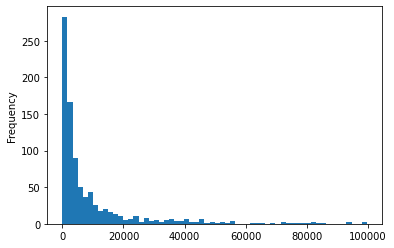

time: 308 ms (started: 2022-05-09 11:34:32 +00:00)


In [ ]:
df_filter['length'].plot(kind='hist', bins=60)

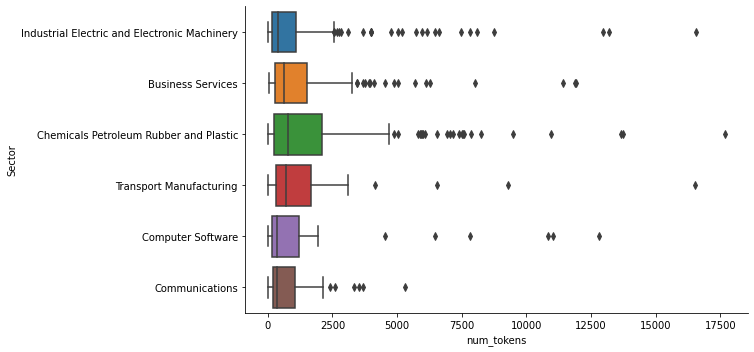

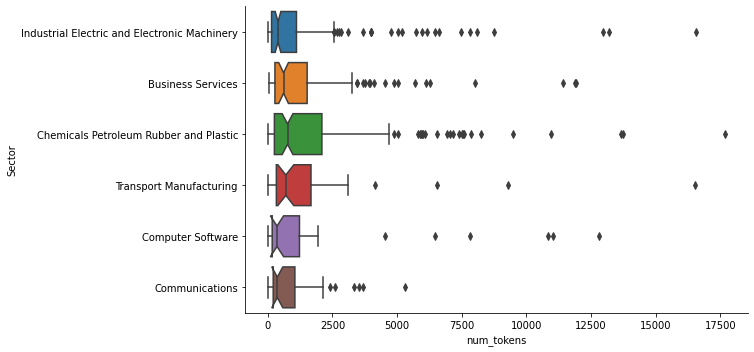

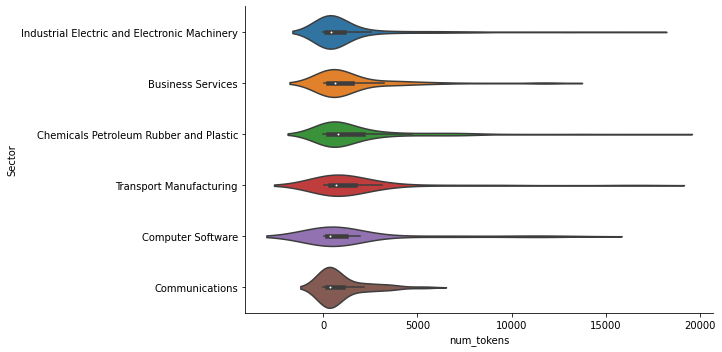

time: 1.33 s (started: 2022-05-09 11:34:32 +00:00)


In [ ]:
where = df_filter['Sector'].isin(['Industrial Electric and Electronic Machinery', 
                           'Chemicals Petroleum Rubber and Plastic', 
                           'Business Services', 
                           'Transport Manufacturing', 
                           'Computer Software',
                           'Communications',
                          #  'Food and Tobacco Manufacturing',
                          #  'Metals and Metal Products',
                          #  'Biotechnology and Life Sciences',
                          #  'Banking Insurance and Financial Services',
                          #  'Mining and Extraction',
                          #  'Wood Furniture and Paper Manufacturing',
                          #  'Computer Hardware',
                          #  'Wholesale',
                          #  'Leather Stone Clay and Glass products'
                           ])	
g = sns.catplot(data=df_filter[where], x="num_tokens", y="Sector", kind='box')
g.fig.set_figwidth(25)
g = sns.catplot(data=df_filter[where], x="num_tokens", y="Sector", kind='box', notch=True)
g.fig.set_figwidth(25)
g = sns.catplot(data=df_filter[where], x="num_tokens", y="Sector", kind='violin')
g.fig.set_figwidth(25)

How to deal with this kind of dataset???

### 2.6 Average length of the tokens

In [ ]:
def count_word_len(tokens):
  return sum([len(tok) for tok in tokens]) / len(tokens)
df['avg_wordsize'] = df['tokens'].map(count_word_len)
df['nr_types'] = df['tokens'].map(set).map(len)
display(df)

,Nb_company,Company,Sector,Text_para,length,tokens,num_tokens,avg_wordsize,nr_types
Firmreg_id,,,,,,,,,
F_AT000060,686,AMS AG,Industrial Electric and Electronic Machinery,"Born in the Netherlands, Wim received a PhD i...",3585,"[Born, in, the, Netherlands, ,, Wim, received,...",613,4.970636,231
F_AT000087,439,AT&S AUSTRIA TECHNOLOGIE & SYSTEMTECHNIK AG,Industrial Electric and Electronic Machinery,The core development sector Functionality Inte...,9208,"[The, core, development, sector, Functionality...",1531,5.103854,575
F_AT000135,551,BDI BETEILIGUNGS GMBH,Business Services,We stand for excellence in the conceptual des...,1892,"[We, stand, for, excellence, in, the, conceptu...",301,5.392027,175
F_AT000149,546,PLANSEE HOLDING AG,Metals and Metal Products,". In , the winning projects in the categories ...",1887,"[., In, ,, the, winning, projects, in, the, ca...",312,5.118590,161
F_AT000189,407,LENZING AG,Chemicals Petroleum Rubber and Plastic,From producing fibers made from wood to becomi...,11434,"[From, producing, fibers, made, from, wood, to...",1921,5.051536,746
...,...,...,...,...,...,...,...,...,...
F_US001076,221,"MEDIDATA SOLUTIONS, INC.",Industrial Electric and Electronic Machinery,Data integration feeds the med device innovati...,6852,"[Data, integration, feeds, the, med, device, i...",1045,5.644019,498
F_US001079,787,FMC CORP,Chemicals Petroleum Rubber and Plastic,FMC s technology organization is driven by a s...,5989,"[FMC, s, technology, organization, is, driven,...",992,5.137097,451
F_VG000003,673,NOMAD FOODS LIMITED,Food and Tobacco Manufacturing,We combine our global scale and local proximit...,611,"[We, combine, our, global, scale, and, local, ...",102,5.078431,55


time: 852 ms (started: 2022-05-09 11:34:34 +00:00)


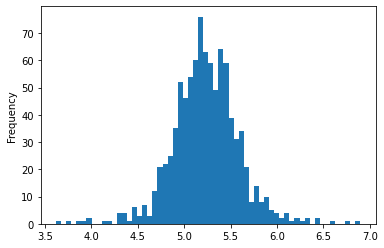

time: 311 ms (started: 2022-05-09 11:34:35 +00:00)


In [ ]:
df['avg_wordsize'].plot(kind='hist', bins=60)

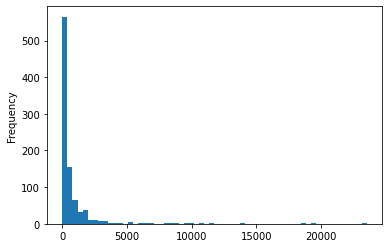

time: 287 ms (started: 2022-05-09 11:34:35 +00:00)


In [ ]:
df['nr_types'].plot(kind='hist', bins=60)

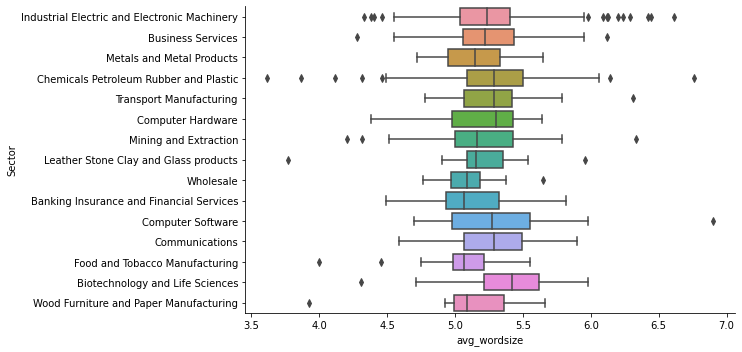

time: 593 ms (started: 2022-05-09 11:34:35 +00:00)


In [ ]:
where = df['Sector'].isin(['Industrial Electric and Electronic Machinery', 
                           'Chemicals Petroleum Rubber and Plastic', 
                           'Business Services', 
                           'Transport Manufacturing', 
                           'Computer Software',
                           'Communications',
                           'Food and Tobacco Manufacturing',
                           'Metals and Metal Products',
                           'Biotechnology and Life Sciences',
                           'Banking Insurance and Financial Services',
                           'Mining and Extraction',
                           'Wood Furniture and Paper Manufacturing',
                           'Computer Hardware',
                           'Wholesale',
                           'Leather Stone Clay and Glass products'])
g = sns.catplot(data=df[where], x="avg_wordsize", y="Sector", kind='box')
g.fig.set_figwidth(25)

### 2.7 Zipf

In [ ]:
alltoks = [item for sublist in df['tokens'] for item in sublist] 
len(alltoks)

4431279

time: 264 ms (started: 2022-05-09 11:34:36 +00:00)


In [ ]:
counter = Counter(alltoks)
counter.most_common(22)

[(',', 208871),
 ('the', 190304),
 ('and', 150116),
 ('.', 136534),
 ('to', 115095),
 ('of', 111083),
 ('a', 77309),
 ('in', 73056),
 ('for', 50299),
 ('is', 47399),
 ('that', 35164),
 ('with', 33912),
 ('on', 26808),
 ('are', 26016),
 ('as', 25025),
 (')', 23850),
 ('(', 23555),
 ('The', 22252),
 ('by', 18017),
 ('be', 17908),
 ('our', 17885),
 ('from', 16887)]

time: 640 ms (started: 2022-05-09 11:34:36 +00:00)


In [ ]:
freq_df = pd.DataFrame.from_dict(counter, orient='index', columns=['freq'])
freq_df.sort_values('freq', inplace=True, ascending=False)
freq_df

,freq
",",208871
the,190304
and,150116
.,136534
to,115095
...,...
products.SABIC,1
metals.For,1
most-pressing,1
impact.SABIC,1


time: 115 ms (started: 2022-05-09 11:34:37 +00:00)


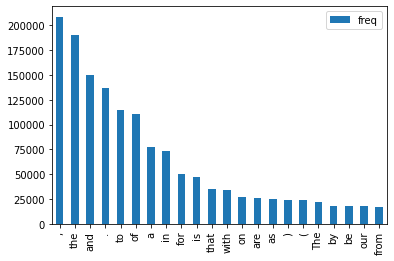

time: 418 ms (started: 2022-05-09 11:34:37 +00:00)


In [ ]:
freq_df.head(22).plot(kind='bar')

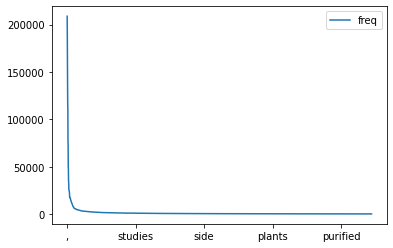

time: 173 ms (started: 2022-05-09 11:34:37 +00:00)


In [ ]:
freq_df.head(2222).plot()

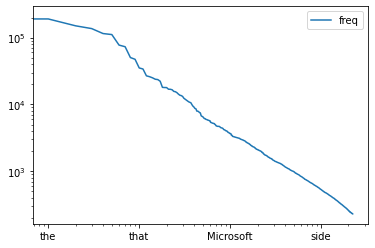

time: 692 ms (started: 2022-05-09 11:34:38 +00:00)


In [ ]:
freq_df.head(2222).plot(loglog=True)

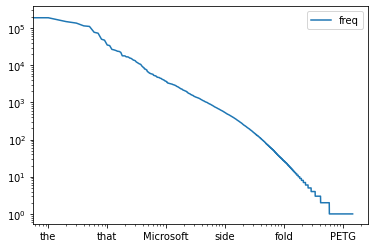

time: 1.33 s (started: 2022-05-09 11:34:38 +00:00)


In [ ]:
freq_df.plot(loglog=True)

### 2.8 Wordcloud

(-0.5, 399.5, 199.5, -0.5)

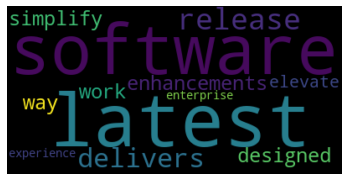

time: 251 ms (started: 2022-05-09 11:34:40 +00:00)


In [ ]:
text = df.query("Sector=='Computer Software'")['Text_para'].values[0]
wc = WordCloud(max_words=100)
wc.generate(text)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")

(-0.5, 399.5, 199.5, -0.5)

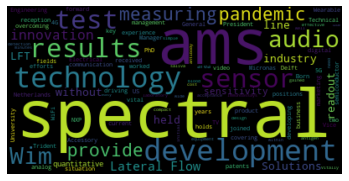

time: 397 ms (started: 2022-05-09 11:34:40 +00:00)


In [ ]:
text = df.query("Sector=='Industrial Electric and Electronic Machinery'")['Text_para'].values[0]
wc = WordCloud(max_words=100)
wc.generate(text)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")

### 2.9 Remove stopwords

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

time: 28.1 ms (started: 2022-05-09 11:34:40 +00:00)


In [ ]:
from nltk.corpus import stopwords
stops = set(stopwords.words('english'))

def tokenCleaner(tokens):
    tokensFiltered = []
    for t in tokens:
        t = t.lower() # lowercase
        if t not in stops and re.match(r"\w+", t) is not None: # remove stopwords and pouncuations
            tokensFiltered.append(t)
    return tokensFiltered

df['tokens_cleaned'] = df['tokens'].map(tokenCleaner)
df['avg_wordsize_cleaned'] = df['tokens_cleaned'].map(count_word_len)
df['nr_types_cleaned'] = df['tokens_cleaned'].map(set).map(len)
display(df)

,Nb_company,Company,Sector,Text_para,length,tokens,num_tokens,avg_wordsize,nr_types,tokens_cleaned,avg_wordsize_cleaned,nr_types_cleaned
Firmreg_id,,,,,,,,,,,,
F_AT000060,686,AMS AG,Industrial Electric and Electronic Machinery,"Born in the Netherlands, Wim received a PhD i...",3585,"[Born, in, the, Netherlands, ,, Wim, received,...",613,4.970636,231,"[born, netherlands, wim, received, phd, electr...",7.117647,181
F_AT000087,439,AT&S AUSTRIA TECHNOLOGIE & SYSTEMTECHNIK AG,Industrial Electric and Electronic Machinery,The core development sector Functionality Inte...,9208,"[The, core, development, sector, Functionality...",1531,5.103854,575,"[core, development, sector, functionality, int...",7.505562,467
F_AT000135,551,BDI BETEILIGUNGS GMBH,Business Services,We stand for excellence in the conceptual des...,1892,"[We, stand, for, excellence, in, the, conceptu...",301,5.392027,175,"[stand, excellence, conceptual, design, implem...",8.242038,134
F_AT000149,546,PLANSEE HOLDING AG,Metals and Metal Products,". In , the winning projects in the categories ...",1887,"[., In, ,, the, winning, projects, in, the, ca...",312,5.118590,161,"[winning, projects, categories, university, re...",7.608434,119
F_AT000189,407,LENZING AG,Chemicals Petroleum Rubber and Plastic,From producing fibers made from wood to becomi...,11434,"[From, producing, fibers, made, from, wood, to...",1921,5.051536,746,"[producing, fibers, made, wood, becoming, glob...",7.424063,628
...,...,...,...,...,...,...,...,...,...,...,...,...
F_US001076,221,"MEDIDATA SOLUTIONS, INC.",Industrial Electric and Electronic Machinery,Data integration feeds the med device innovati...,6852,"[Data, integration, feeds, the, med, device, i...",1045,5.644019,498,"[data, integration, feeds, med, device, innova...",7.769352,417
F_US001079,787,FMC CORP,Chemicals Petroleum Rubber and Plastic,FMC s technology organization is driven by a s...,5989,"[FMC, s, technology, organization, is, driven,...",992,5.137097,451,"[fmc, technology, organization, driven, set, p...",7.321234,362
F_VG000003,673,NOMAD FOODS LIMITED,Food and Tobacco Manufacturing,We combine our global scale and local proximit...,611,"[We, combine, our, global, scale, and, local, ...",102,5.078431,55,"[combine, global, scale, local, proximity, con...",7.245614,39


time: 4.32 s (started: 2022-05-09 11:34:40 +00:00)


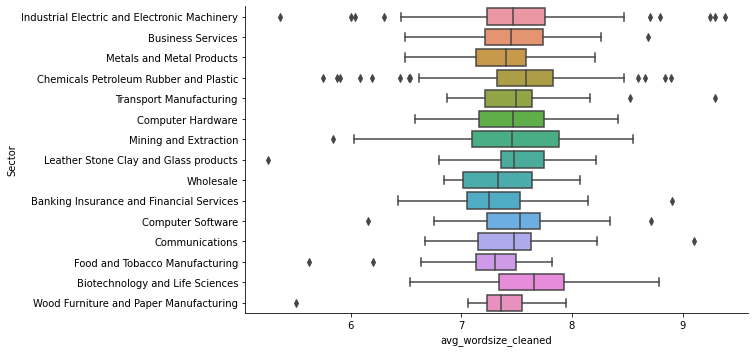

time: 570 ms (started: 2022-05-09 11:34:45 +00:00)


In [ ]:
where = df['Sector'].isin(['Industrial Electric and Electronic Machinery', 
                           'Chemicals Petroleum Rubber and Plastic', 
                           'Business Services', 
                           'Transport Manufacturing', 
                           'Computer Software',
                           'Communications',
                           'Food and Tobacco Manufacturing',
                           'Metals and Metal Products',
                           'Biotechnology and Life Sciences',
                           'Banking Insurance and Financial Services',
                           'Mining and Extraction',
                           'Wood Furniture and Paper Manufacturing',
                           'Computer Hardware',
                           'Wholesale',
                           'Leather Stone Clay and Glass products'])
g = sns.catplot(data=df[where], x="avg_wordsize_cleaned", y="Sector", kind='box')
g.fig.set_figwidth(25)

Retry zipf

In [ ]:
alltoks_cleaned = [item for sublist in df['tokens_cleaned'] for item in sublist] 
len(alltoks_cleaned), len(alltoks)

(2446936, 4431279)

time: 126 ms (started: 2022-05-09 11:34:45 +00:00)


In [ ]:
counter_cleaned = Counter(alltoks_cleaned)
counter_cleaned.most_common(22)

[('design', 17624),
 ('new', 14014),
 ('research', 13596),
 ('development', 11397),
 ('also', 8827),
 ('innovation', 8765),
 ('data', 7419),
 ('technology', 7112),
 ('use', 6211),
 ('one', 6210),
 ('work', 5930),
 ('system', 5890),
 ('using', 5688),
 ('business', 5552),
 ('products', 5267),
 ('used', 5265),
 ('network', 5235),
 ('solutions', 4839),
 ('windows', 4800),
 ('designed', 4689),
 ('people', 4584),
 ('time', 4570)]

time: 358 ms (started: 2022-05-09 11:34:45 +00:00)


In [ ]:
freq_df_cleaned = pd.DataFrame.from_dict(counter_cleaned, orient='index', columns=['freq'])
freq_df_cleaned.sort_values('freq', inplace=True, ascending=False)
freq_df_cleaned

,freq
design,17624
new,14014
research,13596
development,11397
also,8827
...,...
belgiums,1
counsel.innovation,1
metals.ings,1
minehub,1


time: 84 ms (started: 2022-05-09 11:34:46 +00:00)


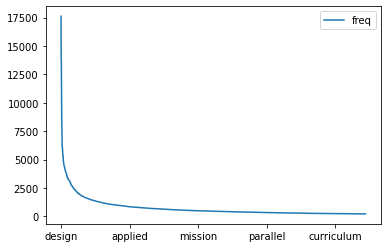

time: 227 ms (started: 2022-05-09 11:34:46 +00:00)


In [ ]:
freq_df_cleaned.head(2222).plot()

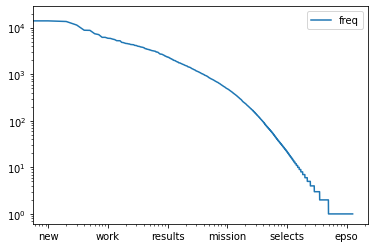

time: 960 ms (started: 2022-05-09 11:34:46 +00:00)


In [ ]:
freq_df_cleaned.plot(loglog=True)

### 2.10 N-grams and tfidf

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

cvectorizer = CountVectorizer(ngram_range=(2, 5), min_df=10, stop_words='english')
textlines = [text for text in df['Text_para']]
print(len(textlines), 'lines of company text')
X = cvectorizer.fit_transform(textlines)
X

924 lines of company text


<924x6028 sparse matrix of type '<class 'numpy.int64'>'
	with 106353 stored elements in Compressed Sparse Row format>

time: 21.9 s (started: 2022-05-09 11:34:47 +00:00)


In [ ]:
Xdf = pd.DataFrame(np.sum(X, axis=0), columns=cvectorizer.get_feature_names()).T.sort_values(by = 0, ascending = False)
Xdf.head(300) # change to 300

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,0
research development,1175
real time,1095
long term,701
product development,684
high quality,681
...,...
cancer patients,95
user friendly,94
manufacturing processes,94
based design,94


time: 47.7 ms (started: 2022-05-09 11:35:09 +00:00)


In [ ]:
tfvectorizer = TfidfVectorizer(ngram_range=(2, 5), min_df=10, stop_words='english', sublinear_tf=True, strip_accents='unicode')
X_tf = tfvectorizer.fit_transform(textlines)
X_tf

<924x6028 sparse matrix of type '<class 'numpy.float64'>'
	with 106353 stored elements in Compressed Sparse Row format>

time: 21.4 s (started: 2022-05-09 11:35:09 +00:00)


In [ ]:
Xdf_tf = pd.DataFrame(np.sum(X_tf, axis=0), columns=tfvectorizer.get_feature_names()).T.sort_values(by = 0, ascending = False)
Xdf_tf.head(300) # change to 300

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,0
research development,20.228214
product development,13.540685
long term,12.661453
rights reserved,12.658114
sustainable development,12.649023
...,...
design build,2.682847
develop products,2.674314
new opportunities,2.670998
product process,2.670465


time: 45 ms (started: 2022-05-09 11:35:30 +00:00)


In [ ]:
# intersection
ngrams = Xdf.head(300).index.tolist()
tfidfs = Xdf_tf.head(300).index.tolist()

intersects = []
for tf in tfidfs:
    if tf in ngrams:
        intersects.append(tf)

intersects_df = pd.DataFrame(intersects)
intersects_df.head(30)

,0
0,research development
1,product development
2,long term
3,sustainable development
4,new products
5,products services
6,real time
7,high quality
8,covid 19
9,innovative solutions


time: 16.9 ms (started: 2022-05-09 11:35:30 +00:00)


### *2.11 Research on the tokenization, stopwords

Solved: 
- Check the stopwords from different resources
- *and, for, of, to, in, out*
- Regex: 'string' 'and' 'string, 'string' 'to' 'string', 'string'&'string', check whether & has been changed in the corpus
- Check the '-' in the countVectorize() method, and compound situation as follows:
    - 1) ice cream - not a prolbem
    - 2) doorknob - not a problem
    - mother-in-law - solve by customized tokenizer


In [ ]:
def check_Ampersand(text):
    if '&' in text:
        return True
    return False
print(f"We have {df['Text_para'].map(check_Ampersand).sum()} rows that contain symbol \'&\' in our corpus")

We have 432 rows that contain symbol '&' in our corpus
time: 21.8 ms (started: 2022-06-13 08:35:22 +00:00)


In [ ]:
import string
import re
from sys import argv
import sys
from collections import Counter	
from nltk.corpus import stopwords
import os.path
from nltk.tag import pos_tag

import nltk
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

# we can use our own stopwords
escapewords = ['and', 'for', 'of', 'to', 'in', 'out']
cachedStopWords = stopwords.words('english')
for ew in escapewords:
    cachedStopWords.remove(ew)
cachedStopWords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'at',
 'by',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'from',
 'up',
 'down',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each',
 'few',
 'more',
 'most',
 'other',
 'some

time: 1.68 s (started: 2022-05-12 08:51:40 +00:00)


In [ ]:
# rewrite the analyzer
# follow most of the parts - preprocessor, tokenizer, ngrams, stopwords
class MyAnalyzer():
    def __init__(self, 
                 ngram_range=(1, 1), 
                 stop_words=None,
                 token_pattern=r"(?u)\b\w\w+\b",
                 ):
        self.ngram_range = ngram_range
        self.stop_words = stop_words
        self.token_pattern = token_pattern

    def __call__(self, doc):
        # preprocessor
        doc = doc.lower()
        # tokenizer
        token_pattern = re.compile(self.token_pattern)
        tmp_tokens = token_pattern.findall(doc)
        # ngrams, stopwords
        if self.stop_words is not None:
            tokens = [w for w in tmp_tokens if w not in self.stop_words]

        # handle token n-grams
        min_n, max_n = self.ngram_range
        if max_n != 1:
            original_tokens = tokens
            if min_n == 1:
                # no need to do any slicing for unigrams
                # just iterate through the original tokens
                tokens = list(original_tokens)
                min_n += 1
            else:
                tokens = []

            n_original_tokens = len(original_tokens)

            # bind method outside of loop to reduce overhead
            tokens_append = tokens.append
            space_join = " ".join

            for n in range(min_n, min(max_n + 1, n_original_tokens + 1)):
                for i in range(n_original_tokens - n + 1):
                    # deal with 'string' 'and' 'string'
                    new_tokens = original_tokens[i : i + n]
                    if new_tokens[0] in escapewords or new_tokens[-1] in escapewords: continue
                    tokens_append(space_join(new_tokens))

        return tokens

time: 35.9 ms (started: 2022-05-12 08:51:43 +00:00)


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

cvectorizer = CountVectorizer(analyzer=MyAnalyzer(ngram_range=(2, 5), 
                                                  stop_words=cachedStopWords,
                                                  token_pattern=r"\b\w&?[\w\-]+\b"), 
                              min_df=10)
textlines = [text for text in df['Text_para']]
print(len(textlines), 'lines of company text')
X = cvectorizer.fit_transform(textlines)
X

924 lines of company text


<924x5925 sparse matrix of type '<class 'numpy.int64'>'
	with 104054 stored elements in Compressed Sparse Row format>

time: 40.5 s (started: 2022-05-12 08:51:47 +00:00)


In [ ]:
Xdf = pd.DataFrame(np.sum(X, axis=0), columns=cvectorizer.get_feature_names()).T.sort_values(by = 0, ascending = False)
Xdf.head(300)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,0
research and development,943
around world,882
product development,677
wide range,628
vice president,500
...,...
energy consumption,91
press release,91
quality control,91
neural networks,91


time: 46.5 ms (started: 2022-05-12 08:52:28 +00:00)


tfidf

In [ ]:
tfvectorizer = TfidfVectorizer(analyzer=MyAnalyzer(ngram_range=(2, 5), 
                                                   stop_words=cachedStopWords,
                                                   token_pattern=r"\b\w&?[\w\-]+\b"), 
                               min_df=10, 
                               sublinear_tf=True)
X_tf = tfvectorizer.fit_transform(textlines)
X_tf

<924x5925 sparse matrix of type '<class 'numpy.float64'>'
	with 104054 stored elements in Compressed Sparse Row format>

time: 31.4 s (started: 2022-05-12 08:52:28 +00:00)


In [ ]:
Xdf_tf = pd.DataFrame(np.sum(X_tf, axis=0), columns=tfvectorizer.get_feature_names()).T.sort_values(by = 0, ascending = False)
Xdf_tf.head(300)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,0
research and development,19.028121
product development,13.961483
around world,13.248063
sustainable development,12.272465
rights reserved,11.405809
...,...
digital innovation,2.688292
business strategy,2.687989
data collected,2.685462
develop products,2.680917


time: 34.9 ms (started: 2022-05-12 08:52:59 +00:00)


In [ ]:
# store the dataframe
pd.DataFrame({"N-gram": Xdf.index, "TFIDF": Xdf_tf.index}).to_csv("ngram_tfidf_comparison.csv")

time: 831 ms (started: 2022-05-12 08:52:59 +00:00)


	New tokens: covid-19 pandemic, development r&d, forward-looking statements, ...
	Attention: un sustainable development(UN sustainable), ...


In [ ]:
def check_word(text):
    index = 0
    while check_str in text[index:]:
            index = text.index(check_str, index)
            print(text[index-20:index+20])
            index += len(check_str)
check_str = 'sustainable development'
df['Text_para'].map(check_word)

r which ensures its sustainable developm
usiness council for sustainable developm
pics such as global sustainable developm
able energy for the sustainable developm
e lies in embracing sustainable developm
arine resources for sustainable developm
 take to ensure the sustainable developm
bal partnership for sustainable developm
, and committing to sustainable developm
hallenges linked to sustainable developm
 must contribute to sustainable developm
he means to achieve sustainable developm
the environment and sustainable developm
ared their views on sustainable developm
itiative to promote sustainable developm
ika is committed to sustainable developm
ortance to ensure a sustainable developm
rces are crucial to sustainable developm
ork aims to promote sustainable developm
sets out to promote sustainable developm
te to the long-term sustainable developm
te to the long-term sustainable developm
o the principles of sustainable developm
aily to support the sustainable developm
aily to support 

Firmreg_id
F_AT000060    None
F_AT000087    None
F_AT000135    None
F_AT000149    None
F_AT000189    None
              ... 
F_US001076    None
F_US001079    None
F_VG000003    None
F_ZA000004    None
F_ZA000005    None
Name: Text_para, Length: 924, dtype: object

time: 59.2 ms (started: 2022-05-12 08:54:41 +00:00)


## Parsering

### 3.1 Sample from Anna

In [ ]:
# -*- coding: utf-8 -*-
# pour lancer le script : python3 parser.py nom_de_fichier_txt french (si le texte est en french)
#il faut installer au préalable les librairies de nltk pour pouvoir l'exécuter
#python3 -m nltk.downloader all

import string
import re
from sys import argv
import sys
from collections import Counter	
from nltk.corpus import stopwords
import os.path
from nltk.tag import pos_tag

# expression régulière pour matcher fin de chaques phrase virgule+espace, point virgule+espace
#deux point, une nouvelle ligne, point et une nuvelle ligne  
re_phrase = re.compile(', |; |\. |:|\n|\.\n')
# expression régulière pour matcher espace
re_mots = re.compile('\s')

totalArgv = len(sys.argv)
if (totalArgv != 3) :
	print ("\n");
	print ("error Arguments!\n");
	print ("usage: python parser.py file_to_parse language\n");
	print ("       file_to_parse: text file\n");
	print ("       language : English or French\n");
	sys.exit(0);

# ouverture du fichier passe en parametre et la langue
script, filename, language = argv
# filename = "./corpus/documents_"+term+str(counter)+".txt"
if (not os.path.isfile(filename)) :
	print ("file doesn't exist");
	sys.exit(0);

if (language.lower()!= "english" and language.lower()!= "french") :
	print ("only English or French language ");
	sys.exit(0);	

file = open(filename, 'r')
print ('Votre fichier est %r:' % filename)
txt=file.read()

#suppression stop words
cachedStopWords = stopwords.words(language)
stop_words = ' '.join([word for word in txt.split() if word not in cachedStopWords])
print (stop_words);

#extraction des noms propres
tagged_sent = pos_tag(txt.split())
propernouns = [word for word,pos in tagged_sent if pos == 'NNP']
print (propernouns);

# dates

#suppression des lignes vides 
re.split('\n\s*\n', txt)
phrases_xml=""

# utilisation de l'expression régulière re_phrase pour separer le contenu de fichier en phrases
phrases=re_phrase.split(txt)

# construction du fichier phrases.xml
 
for phrase in phrases[:]:
	if len(phrase) > 0 :
		phrases_xml=phrases_xml+"<phrase>"+phrase+"</phrase>"+"\n"

# sauvgarde du fichier phrases.xml 		
with open("phrases.xml", "w+") as phrases_xml_file:
	phrases_xml_file.write(phrases_xml)
	
mots_xml=""
# construction du fichier mots.xml 
mots_all=[]
for phrase in phrases[:]:
	mots=re_mots.split(phrase)
	mots_all.extend(mots)
mots_nombre=Counter(w.lower() for w in mots_all) 	
for key, value in mots_nombre.iteritems():	
	if len(key) > 0 :
		mots_xml=mots_xml+"<mot>\n<valeur>"+key+"</valeur>\n<occurence>"+str(value)+"</occurence>\n</mot>\n"

# sauvgarde du fichier mots.xml 		
with open("mots.xml", "w+") as mots_xml_file:
	mots_xml_file.write(mots_xml)
	
mots_xml=''		
for key, value in mots_nombre.iteritems():	
	if len(key) > 0 :
		mots_xml=mots_xml+"<mot valeur="+key+" occurence="+str(value)+" />"+"\n"		
		
# sauvgarde du fichier mots.xml 		
with open("mots_v2.xml", "w+") as mots_xml_file:
	mots_xml_file.write(mots_xml)		

file doesn't exist


SystemExit: ignored

time: 83.6 ms (started: 2022-05-09 11:35:30 +00:00)


/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2890: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


### 3.2 Test on sample codes

In [ ]:
import string
import re
from sys import argv
import sys
from collections import Counter	
from nltk.corpus import stopwords
import os.path
from nltk.tag import pos_tag

import nltk
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

time: 103 ms (started: 2022-05-10 13:07:59 +00:00)


In [ ]:
re_phrase = re.compile(', |; |\. |:|\n|\.\n')
re_mots = re.compile('\s')

time: 1.54 ms (started: 2022-05-09 11:39:11 +00:00)


In [ ]:
filename = "pg6890.txt"
file = open(filename, 'r')
txt = file.read()

time: 241 ms (started: 2022-05-09 11:39:11 +00:00)


In [ ]:
cachedStopWords = stopwords.words('english')
stop_words = ' '.join([word for word in txt.split() if word not in cachedStopWords])
print (stop_words);

There is, course, Campus Osborn Hall. There Mory's. There Yale Station. There Bowl. Enumeration unnecessary. That serve well enough twenty-fifth reunion. For moment affluent detail, comprehend suggestion. We still remember great deal Yale. But wistfulness even specific memories hardly expresses attitude. For take us something glad have. The Comic Spirit quietly insinuated existence point view. Undoubtedly found cherished mansions set fire destroyed, general discovered delights roast pig amidst ruins. You find Senior capable laughing serious Freshman. He sees humor abroad, sensitive divine comedy. Comedy particularizes, whereas tragedy deals general. When one laughs one beginning see things detail. In Freshman year one contents oneself infinite, Senior year one becomes concerned finite. The Freshman poet write Death Eternity, Senior life. After latter merely sincere. For Yale influence one become golden mean, idealize _mens sana corpore sano_. It brilliant bit philosophy that. It satiri

**Problem**: when directly using *txt.split()* things will happen like 'is,', 'reunion.', etc, words with pouncuations, and Capitalized words which will never show up in the stopword.

In [ ]:
# extraction des noms propres
tagged_sent = pos_tag(txt.split())
propernouns = [word for word, pos in tagged_sent if pos == 'NNP']
print(propernouns)

['Campus', 'Osborn', 'Hall.', "Mory's.", 'Yale', 'Station.', 'Bowl.', 'Enumeration', 'Yale.', 'Comic', 'Spirit', 'Senior', 'Freshman.', 'Comedy', 'Freshman', 'Freshman', 'Death', 'Eternity,', 'Senior', 'Yale', 'Caesar', "Caesar's,", "Caesar's.", 'Material', 'Shelley,', 'Chaucer', 'Freshman,', 'Freshman', 'Experience', 'Yale', 'Yale', '"Harvard', 'Yale', 'To-day', 'Insincerity', 'Yale', 'Yale']
time: 131 ms (started: 2022-05-09 11:39:12 +00:00)


In [ ]:
# suppression des lignes vides 
re.split('\n\s*\n', txt)
phrases_xml = ""

# utilisation de l'expression régulière re_phrase pour separer le contenu de fichier en phrases
phrases = re_phrase.split(txt)

# construction du fichier phrases.xml
 
for phrase in phrases[:]:
	if len(phrase) > 0 :
		phrases_xml=phrases_xml+"<phrase>"+phrase+"</phrase>"+"\n"

phrases_xml

'<phrase>There is</phrase>\n<phrase>of course</phrase>\n<phrase>the Campus and Osborn Hall</phrase>\n<phrase>There is Mory\'s</phrase>\n<phrase>There</phrase>\n<phrase>is Yale Station</phrase>\n<phrase>There is the Bowl</phrase>\n<phrase>Enumeration is unnecessary</phrase>\n<phrase>That will</phrase>\n<phrase>serve well enough at the twenty-fifth reunion</phrase>\n<phrase>For the moment we are</phrase>\n<phrase>affluent in detail</phrase>\n<phrase>and comprehend suggestion</phrase>\n<phrase>We still remember a great</phrase>\n<phrase>deal about Yale</phrase>\n<phrase>But there is a wistfulness about even specific memories that hardly</phrase>\n<phrase>expresses our attitude</phrase>\n<phrase>For we take with us something we are glad to</phrase>\n<phrase>have</phrase>\n<phrase>The Comic Spirit has quietly insinuated its existence into our</phrase>\n<phrase>point of view</phrase>\n<phrase>Undoubtedly we have found cherished mansions set on fire</phrase>\n<phrase>and destroyed</phrase>\n<

time: 9.16 ms (started: 2022-05-09 11:39:13 +00:00)


In [ ]:
mots_xml = ""
mots_all = []
for phrase in phrases[:]:
	mots = re_mots.split(phrase)
	mots_all.extend(mots)

mots_nombre = Counter(w.lower() for w in mots_all) 	
for key, value in mots_nombre.items():	
	if len(key) > 0 :
		mots_xml = mots_xml+"<mot>\n<valeur>"+key+"</valeur>\n<occurence>"+str(value)+"</occurence>\n</mot>\n"
mots_xml

'<mot>\n<valeur>there</valeur>\n<occurence>8</occurence>\n</mot>\n<mot>\n<valeur>is</valeur>\n<occurence>26</occurence>\n</mot>\n<mot>\n<valeur>of</valeur>\n<occurence>22</occurence>\n</mot>\n<mot>\n<valeur>course</valeur>\n<occurence>1</occurence>\n</mot>\n<mot>\n<valeur>the</valeur>\n<occurence>43</occurence>\n</mot>\n<mot>\n<valeur>campus</valeur>\n<occurence>1</occurence>\n</mot>\n<mot>\n<valeur>and</valeur>\n<occurence>13</occurence>\n</mot>\n<mot>\n<valeur>osborn</valeur>\n<occurence>1</occurence>\n</mot>\n<mot>\n<valeur>hall</valeur>\n<occurence>1</occurence>\n</mot>\n<mot>\n<valeur>mory\'s</valeur>\n<occurence>1</occurence>\n</mot>\n<mot>\n<valeur>yale</valeur>\n<occurence>8</occurence>\n</mot>\n<mot>\n<valeur>station</valeur>\n<occurence>1</occurence>\n</mot>\n<mot>\n<valeur>bowl</valeur>\n<occurence>1</occurence>\n</mot>\n<mot>\n<valeur>enumeration</valeur>\n<occurence>1</occurence>\n</mot>\n<mot>\n<valeur>unnecessary</valeur>\n<occurence>1</occurence>\n</mot>\n<mot>\n<valeur

time: 9.69 ms (started: 2022-05-09 11:39:14 +00:00)


In [ ]:
mots_xml = ''		
for key, value in mots_nombre.items():	
	if len(key) > 0 :
		mots_xml = mots_xml+"<mot valeur="+key+" occurence="+str(value)+" />"+"\n"
mots_xml

'<mot valeur=there occurence=8 />\n<mot valeur=is occurence=26 />\n<mot valeur=of occurence=22 />\n<mot valeur=course occurence=1 />\n<mot valeur=the occurence=43 />\n<mot valeur=campus occurence=1 />\n<mot valeur=and occurence=13 />\n<mot valeur=osborn occurence=1 />\n<mot valeur=hall occurence=1 />\n<mot valeur=mory\'s occurence=1 />\n<mot valeur=yale occurence=8 />\n<mot valeur=station occurence=1 />\n<mot valeur=bowl occurence=1 />\n<mot valeur=enumeration occurence=1 />\n<mot valeur=unnecessary occurence=1 />\n<mot valeur=that occurence=10 />\n<mot valeur=will occurence=4 />\n<mot valeur=serve occurence=1 />\n<mot valeur=well occurence=1 />\n<mot valeur=enough occurence=2 />\n<mot valeur=at occurence=4 />\n<mot valeur=twenty-fifth occurence=1 />\n<mot valeur=reunion occurence=1 />\n<mot valeur=for occurence=7 />\n<mot valeur=moment occurence=1 />\n<mot valeur=we occurence=6 />\n<mot valeur=are occurence=9 />\n<mot valeur=affluent occurence=1 />\n<mot valeur=in occurence=11 />\n<mo

time: 6.55 ms (started: 2022-05-09 11:39:14 +00:00)


### 3.3 Parsering on the corpus

#### 3.3.1 Build a dictionary of the ground truth


In [ ]:
read_file = pd.read_excel('/content/drive/MyDrive/COURSE/Intern/Terms malantin 1er juin 2022.xlsx', sheet_name='categories 1 juin 2022')
read_file

,Main form,Sustainability preoccupations,Digital transformation,Change in management,Innovation activities,Business Model,Corporate social responsibility ou CSR
0,3D printing,NaN,3D printing,NaN,NaN,NaN,NaN
1,academic institutions,NaN,NaN,academic institutions,NaN,NaN,NaN
2,additive manufacturing,NaN,additive manufacturing,NaN,NaN,NaN,NaN
3,application development,NaN,NaN,NaN,application development,NaN,NaN
4,Applied Research,NaN,NaN,NaN,Applied Research,NaN,NaN
...,...,...,...,...,...,...,...
300,user interface,NaN,NaN,NaN,user interface,NaN,NaN
301,Validated Designs,NaN,NaN,NaN,Validated Designs,NaN,NaN
302,value chain,NaN,NaN,NaN,NaN,value chain,NaN
303,virtual reality,NaN,virtual reality,NaN,NaN,NaN,NaN


time: 1.1 s (started: 2022-06-13 08:03:12 +00:00)


In [ ]:
read_file.dropna(0, how='all', inplace=True)
read_file.dropna(1, how='all', inplace=True)

time: 16.4 ms (started: 2022-06-13 08:03:13 +00:00)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.dropna will be keyword-only
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.dropna will be keyword-only
  


In [ ]:
gold_dict = {}
for i in range(1, len(read_file)):
    if read_file.iloc[i]['Main form'] is None:
        continue
    gold_dict[read_file.iloc[i]['Main form']] = []

for i in range(1, len(read_file)):
    index = read_file.iloc[i]['Main form']
    if index is None:
        continue
    if not read_file.iloc[i].isna()['Sustainability preoccupations']:
        gold_dict[index].append('Sustainability preoccupations')
    if not read_file.iloc[i].isna()['Digital transformation']:
        gold_dict[index].append('Digital transformation')
    if not read_file.iloc[i].isna()['Change in management']:
        gold_dict[index].append('Change in management')
    if not read_file.iloc[i].isna()['Innovation activities']:
        gold_dict[index].append('Innovation activities')
    if not read_file.iloc[i].isna()['Business Model']:
        gold_dict[index].append('Business Model')
    if not read_file.iloc[i].isna()['Corporate social responsibility ou CSR']:
        gold_dict[index].append('Corporate social responsibility ou CSR') 
    # if not read_file.iloc[i].isna()['strategy']:
    #     gold_dict[index].append('strategy') 
gold_dict

{'AWS Certified Developer': ['Digital transformation'],
 'AWS cloud computing': ['Digital transformation'],
 'Applied Research': ['Innovation activities'],
 'Big Data': ['Digital transformation'],
 'CO2 emissions': ['Sustainability preoccupations'],
 'CSR': ['Corporate social responsibility ou CSR'],
 'Clever e-tools': ['Digital transformation'],
 'Corporate social responsibility': ['Corporate social responsibility ou CSR'],
 'Creative Center': ['Innovation activities'],
 'DESIGN VISION': ['Innovation activities'],
 'DIGITALIZATION PROCESS': ['Digital transformation'],
 'Design and functionality': ['Innovation activities'],
 'Innovation Center': ['Innovation activities'],
 'Innovation Centre': ['Innovation activities'],
 'Innovation Challenge': ['Innovation activities'],
 'Innovation Group': ['Innovation activities'],
 'Innovation Hub': ['Innovation activities'],
 'Innovation Management': ['Innovation activities'],
 'Innovation Studio': ['Innovation activities'],
 'Innovation network':

time: 425 ms (started: 2022-06-13 08:03:13 +00:00)


In [ ]:
# For those not classified, still assigned 'Unknown'
for key, value in gold_dict.items():
    if len(value) is 0:
        gold_dict[key].append('Unknown')

time: 2.02 ms (started: 2022-06-13 08:03:14 +00:00)


In [ ]:
# Change the category for four keywords
# academic institutions, university & research institutions, service among university, 
# worldwide research centres
category = 'Innovation activities'
changelist = ['academic institutions', 'worldwide research centers', 'university and research institutions', 'customer service among university']
for c in changelist:
    gold_dict[c][0] = category

time: 3.08 ms (started: 2022-06-13 08:03:14 +00:00)


Deal with the singular and plural cases in keywords

In [ ]:
cortext3 = open("/content/drive/MyDrive/COURSE/Intern/Cortext3_min_delac_flex_utf8.txt", "r")
lines = cortext3.readlines()
lefts, rights = [], []
for line in lines:
    left, right = line.split(',')
    if left != right.split('.')[0]:
        lefts.append(left)
        rights.append(right.split('.')[0])

time: 315 ms (started: 2022-06-13 08:03:14 +00:00)


In [ ]:
tmp_gold_dict = gold_dict.copy()
for key, value in tmp_gold_dict.items():
    if key in lefts:
        index = lefts.index(key)
        right = rights[index]
        gold_dict[right] = gold_dict[key]
    if key in rights:
        indices = [i for i, word in enumerate(rights) if word == key]
        for index in indices:
            left = lefts[index]
            gold_dict[left] = gold_dict[key]

time: 21.5 ms (started: 2022-06-13 08:03:17 +00:00)


In [ ]:
tmp_dict = {}
for k in gold_dict.keys():
    tmp_dict[k] = []
for k, v in gold_dict.items():
    tmp_dict[k] = list(set(v))
gold_dict = tmp_dict
gold_dict

{'AWS Certified Developer': ['Digital transformation'],
 'AWS cloud computing': ['Digital transformation'],
 'Applied Research': ['Innovation activities'],
 'Big Data': ['Digital transformation'],
 'CO2 emissions': ['Sustainability preoccupations'],
 'CSR': ['Corporate social responsibility ou CSR'],
 'Clever e-tools': ['Digital transformation'],
 'Corporate social responsibility': ['Corporate social responsibility ou CSR'],
 'Creative Center': ['Innovation activities'],
 'DESIGN VISION': ['Innovation activities'],
 'DIGITALIZATION PROCESS': ['Digital transformation'],
 'Design and functionality': ['Innovation activities'],
 'Innovation Center': ['Innovation activities'],
 'Innovation Centre': ['Innovation activities'],
 'Innovation Challenge': ['Innovation activities'],
 'Innovation Group': ['Innovation activities'],
 'Innovation Hub': ['Innovation activities'],
 'Innovation Management': ['Innovation activities'],
 'Innovation Studio': ['Innovation activities'],
 'Innovation network':

time: 23.6 ms (started: 2022-06-13 08:03:18 +00:00)


##### Test the overlapping

The problem: 

1. We have some overlapping keywords - find how many are there?
2. They belong to different categories - fix it!

- 'entire value chain': ['strategy'],
- 'entire value chains': ['strategy']
- 'value chain': ['Unknown', 'strategy'],
- 'value chains': ['Unknown', 'strategy']

In [ ]:
import os
gold_list = list(gold_dict.keys())
common_string = []
common_string_dict = {}
for i in range(len(gold_list)):
    for j in range(i+1, len(gold_list)):
        lefts = gold_list[i].split()
        rights = gold_list[j].split()
        if lefts[0] == rights[-1] or lefts[-1] == rights[0]:
            common_string.append((gold_list[i], gold_list[j]))
            if gold_dict[gold_list[i]] != gold_dict[gold_list[j]]: 
                common_string_dict[(gold_list[i], gold_list[j])] = (gold_dict[gold_list[i]], gold_dict[gold_list[j]])
        if len(lefts) >= 2 and len(rights) >= 2:
            if (lefts[0] == rights[-2] and lefts[1] == rights[-1]) or (lefts[-2] == rights[0] and lefts[-1] == rights[1]):
                common_string.append((gold_list[i], gold_list[j]))
                if gold_dict[gold_list[i]] != gold_dict[gold_list[j]]: 
                    common_string_dict[(gold_list[i], gold_list[j])] = (gold_dict[gold_list[i]], gold_dict[gold_list[j]])
        # if len(lefts) >= 3 and len(rights) >= 3:
        #     if lefts[:3] == rights[-3:] or rights[:3] == lefts[-3:]:
        #         common_string.append((gold_list[i], gold_list[j]))
        #         if gold_dict[gold_list[i]] != gold_dict[gold_list[j]]: 
        #             common_string_dict[(gold_list[i], gold_list[j])] = (gold_dict[gold_list[i]], gold_dict[gold_list[j]])
common_string_dict

{('Applied Research', 'Research Foundation'): (['Innovation activities'],
  ['Change in management']),
 ('Innovation Center', 'Open Innovation'): (['Innovation activities'],
  ['Change in management']),
 ('Innovation Centre', 'Open Innovation'): (['Innovation activities'],
  ['Change in management']),
 ('Innovation Challenge', 'Open Innovation'): (['Innovation activities'],
  ['Change in management']),
 ('Innovation Challenge',
  'Open Innovation Challenge'): (['Innovation activities'], ['Change in management']),
 ('Innovation Group', 'Open Innovation'): (['Innovation activities'],
  ['Change in management']),
 ('Innovation Hub', 'Open Innovation'): (['Innovation activities'],
  ['Change in management']),
 ('Innovation Management', 'Open Innovation'): (['Innovation activities'],
  ['Change in management']),
 ('Innovation Studio', 'Open Innovation'): (['Innovation activities'],
  ['Change in management']),
 ('Innovation network', 'network design'): (['Change in management'],
  ['Innovat

time: 403 ms (started: 2022-06-02 14:47:17 +00:00)


#### 3.3.2 Split the sentences


In [ ]:
def label_phrase(text):
    phrases_xml = ""
    indices = [0]
    indices.extend([i.start()+1 for i in re.finditer('(\.{1,3}|\!|\?|\n|\.)(\s|\n)*', text)])
    phrases = [text[i:j] for i,j in zip(indices, indices[1:]+[None])]
    for phrase in phrases[:]:
      if len(phrase) > 0 :
        phrases_xml = phrases_xml+"<phrase>"+phrase.strip()+"</phrase>"+"\n"
    return phrases_xml[:-1]

df['label_phrase'] = df['Text_para'].map(label_phrase)
df

,Firmreg_id,Nb_company,Company,Sector,Text_para,label_phrase,label_phrase_spacy,label_word
0,F_AT000060,686,AMS AG,Industrial Electric and Electronic Machinery,"Born in the Netherlands, Wim received a PhD i...","<phrase>Born in the Netherlands, Wim received ...","<phrase>Born in the Netherlands, Wim received ...","<phrase>Born in the Netherlands, Wim received ..."
1,F_AT000087,439,AT&S AUSTRIA TECHNOLOGIE & SYSTEMTECHNIK AG,Industrial Electric and Electronic Machinery,The core development sector Functionality Inte...,<phrase>The core development sector Functional...,<phrase>The core development sector Functional...,<phrase category='RDI activity markers'>The co...
2,F_AT000135,551,BDI BETEILIGUNGS GMBH,Business Services,We stand for excellence in the conceptual des...,<phrase>We stand for excellence in the concept...,<phrase>We stand for excellence in the concept...,<phrase>We stand for excellence in the concept...
3,F_AT000149,546,PLANSEE HOLDING AG,Metals and Metal Products,". In , the winning projects in the categories ...","<phrase>.</phrase>\n<phrase>In , the winning p...","<phrase>.</phrase>\n<phrase>In , the winning p...","<phrase>.</phrase>\n<phrase>In , the winning p..."
4,F_AT000189,407,LENZING AG,Chemicals Petroleum Rubber and Plastic,From producing fibers made from wood to becomi...,<phrase>From producing fibers made from wood t...,<phrase>From producing fibers made from wood t...,<phrase>From producing fibers made from wood t...
...,...,...,...,...,...,...,...,...
919,F_US001076,221,"MEDIDATA SOLUTIONS, INC.",Industrial Electric and Electronic Machinery,Data integration feeds the med device innovati...,<phrase>Data integration feeds the med device ...,<phrase>Data integration feeds the med device ...,<phrase>Data integration feeds the med device ...
920,F_US001079,787,FMC CORP,Chemicals Petroleum Rubber and Plastic,FMC s technology organization is driven by a s...,<phrase>FMC s technology organization is drive...,<phrase>FMC s technology organization is drive...,<phrase>FMC s technology organization is drive...
921,F_VG000003,673,NOMAD FOODS LIMITED,Food and Tobacco Manufacturing,We combine our global scale and local proximit...,<phrase>We combine our global scale and local ...,<phrase>We combine our global scale and local ...,<phrase>We combine our global scale and local ...
922,F_ZA000004,111,SAPPI LIMITED,Wood Furniture and Paper Manufacturing,Our mission at Sappi Southern Africas departme...,<phrase>Our mission at Sappi Southern Africas ...,<phrase>Our mission at Sappi Southern Africas ...,<phrase category='Unknown'>Our mission at Sapp...


time: 26.9 s (started: 2022-06-01 12:29:38 +00:00)


Try to use spacy, because the corpus is not clean and standard enough, like:

- and audio sensors. **is** key to overcoming the current pandemic situation. **ams**
- monitoring **system.Watch** ams keynote about Delivering Pandemic Control

In [ ]:
# !pip install -U spacy
import spacy
spacy.__version__

'3.3.0'

time: 9.01 s (started: 2022-05-11 12:14:38 +00:00)


In [ ]:
from spacy.lang.en import English

nlp = English()
nlp.add_pipe("sentencizer")

time: 227 ms (started: 2022-05-11 12:14:47 +00:00)


In [ ]:
def label_phrase_spacy(text):
    phrases_xml = ""
    phrases = []
    if len(text) >= 1000000:
        index, gap = 0, 1000000
        while index <= len(text):
            subtext = text[index:min(index+gap, len(text))]
            doc = nlp(subtext)
            phrases.extend([str(sent) for sent in doc.sents])
            index += gap
    else:
        doc = nlp(text)
        phrases = [str(sent) for sent in doc.sents]
    for phrase in phrases[:]:
      if len(phrase) > 0:
        phrases_xml = phrases_xml+"<phrase>"+phrase.strip()+"</phrase>"+"\n"
    return phrases_xml[:-1]

df['label_phrase_spacy'] = df['Text_para'].map(label_phrase_spacy)
df

,Nb_company,Company,Sector,Text_para,label_phrase,label_phrase_spacy
Firmreg_id,,,,,,
F_AT000060,686,AMS AG,Industrial Electric and Electronic Machinery,"Born in the Netherlands, Wim received a PhD i...","<phrase>Born in the Netherlands, Wim received ...","<phrase>Born in the Netherlands, Wim received ..."
F_AT000087,439,AT&S AUSTRIA TECHNOLOGIE & SYSTEMTECHNIK AG,Industrial Electric and Electronic Machinery,The core development sector Functionality Inte...,<phrase>The core development sector Functional...,<phrase>The core development sector Functional...
F_AT000135,551,BDI BETEILIGUNGS GMBH,Business Services,We stand for excellence in the conceptual des...,<phrase>We stand for excellence in the concept...,<phrase>We stand for excellence in the concept...
F_AT000149,546,PLANSEE HOLDING AG,Metals and Metal Products,". In , the winning projects in the categories ...","<phrase>.</phrase>\n<phrase>In , the winning p...","<phrase>.</phrase>\n<phrase>In , the winning p..."
F_AT000189,407,LENZING AG,Chemicals Petroleum Rubber and Plastic,From producing fibers made from wood to becomi...,<phrase>From producing fibers made from wood t...,<phrase>From producing fibers made from wood t...
...,...,...,...,...,...,...
F_US001076,221,"MEDIDATA SOLUTIONS, INC.",Industrial Electric and Electronic Machinery,Data integration feeds the med device innovati...,<phrase>Data integration feeds the med device ...,<phrase>Data integration feeds the med device ...
F_US001079,787,FMC CORP,Chemicals Petroleum Rubber and Plastic,FMC s technology organization is driven by a s...,<phrase>FMC s technology organization is drive...,<phrase>FMC s technology organization is drive...
F_VG000003,673,NOMAD FOODS LIMITED,Food and Tobacco Manufacturing,We combine our global scale and local proximit...,<phrase>We combine our global scale and local ...,<phrase>We combine our global scale and local ...


time: 35.1 s (started: 2022-05-11 12:14:54 +00:00)


In [ ]:
df['label_phrase_spacy'].iloc[1].split("\n")

['<phrase>The core development sector Functionality Integration focusses the development of new solutions to embed components that cannot be embedded using current AT&S ECP-technology.</phrase>',
 '<phrase>Advanced Concepts goal is to establish readiness of the technology for further product development and finally successful industrialization and market launch.</phrase>',
 '<phrase>Electronic industry is a well-known source for innovation since years.</phrase>',
 '<phrase>Especially innovations the field of information and communication technology have been able to impact not only technology but also the whole society.</phrase>',
 '<phrase>Today communication by means of electronic devices is available from nearly every location on this planet, new electronic solutions for mobility applications are increasing safety and reduce fuel consumption and new electronic technologies for medical applications are increasing our life expectancy.</phrase>',
 '<phrase>As the cutting point between 

time: 4.98 ms (started: 2022-05-11 12:15:29 +00:00)


In [ ]:
import copy 

def label_word(phrases):
    texts = phrases.split('\n')
    new_texts = []
    for text in texts:
        flag = False
        categories = []
        for key, value in gold_dict.items():	
            if key in text:
                # detect the case: 
                # 'product development' in the dictionary
                # but 'product developments' in the text
                start_idx = text.index(key)
                end_idx = text.index(key) + len(key)
                if bool(re.match('^[a-zA-Z0-9]*$', text[end_idx])): continue
                text = text[:start_idx]+'<mot value=\''+','.join(value)+'\'>'+text[start_idx:end_idx]+'</mot>'+text[end_idx:]
                categories.extend(value)
                flag = True
        if not flag:
            new_texts.append(text)
            continue
        str_text = copy.deepcopy(text[:7])
        end_text = copy.deepcopy(text[7:])
        new_texts.append(str_text+' category=\''+','.join(set(categories))+'\''+end_text)
    return '\n'.join(new_texts)

time: 12.8 ms (started: 2022-05-11 12:20:12 +00:00)


In [ ]:
df['label_word'] = df['label_phrase_spacy'].map(label_word)
df

,Nb_company,Company,Sector,Text_para,label_phrase,label_phrase_spacy,label_word
Firmreg_id,,,,,,,
F_AT000060,686,AMS AG,Industrial Electric and Electronic Machinery,"Born in the Netherlands, Wim received a PhD i...","<phrase>Born in the Netherlands, Wim received ...","<phrase>Born in the Netherlands, Wim received ...","<phrase>Born in the Netherlands, Wim received ..."
F_AT000087,439,AT&S AUSTRIA TECHNOLOGIE & SYSTEMTECHNIK AG,Industrial Electric and Electronic Machinery,The core development sector Functionality Inte...,<phrase>The core development sector Functional...,<phrase>The core development sector Functional...,<phrase category='RDI activity markers'>The co...
F_AT000135,551,BDI BETEILIGUNGS GMBH,Business Services,We stand for excellence in the conceptual des...,<phrase>We stand for excellence in the concept...,<phrase>We stand for excellence in the concept...,<phrase>We stand for excellence in the concept...
F_AT000149,546,PLANSEE HOLDING AG,Metals and Metal Products,". In , the winning projects in the categories ...","<phrase>.</phrase>\n<phrase>In , the winning p...","<phrase>.</phrase>\n<phrase>In , the winning p...","<phrase>.</phrase>\n<phrase>In , the winning p..."
F_AT000189,407,LENZING AG,Chemicals Petroleum Rubber and Plastic,From producing fibers made from wood to becomi...,<phrase>From producing fibers made from wood t...,<phrase>From producing fibers made from wood t...,<phrase>From producing fibers made from wood t...
...,...,...,...,...,...,...,...
F_US001076,221,"MEDIDATA SOLUTIONS, INC.",Industrial Electric and Electronic Machinery,Data integration feeds the med device innovati...,<phrase>Data integration feeds the med device ...,<phrase>Data integration feeds the med device ...,<phrase>Data integration feeds the med device ...
F_US001079,787,FMC CORP,Chemicals Petroleum Rubber and Plastic,FMC s technology organization is driven by a s...,<phrase>FMC s technology organization is drive...,<phrase>FMC s technology organization is drive...,<phrase>FMC s technology organization is drive...
F_VG000003,673,NOMAD FOODS LIMITED,Food and Tobacco Manufacturing,We combine our global scale and local proximit...,<phrase>We combine our global scale and local ...,<phrase>We combine our global scale and local ...,<phrase>We combine our global scale and local ...


time: 20.7 s (started: 2022-05-11 12:20:12 +00:00)


In [ ]:
dic2=dict(sorted(gold_dict.items(),key=lambda x:len(x[0]), reverse=True))
print(dic2)

{'restructuring of human resource management practices': ['Change in management'], 'restructuring of quality-related practices': ['Innovation activities'], 'real-time management of the supply chain\xa0': ['Business Model'], 'digital tablet to supervise production': ['Digital transformation'], 'restructuring of production processes': ['Innovation activities'], 'university and research institutions': ['Change in management'], 'customer service among universities': ['Change in management'], 'restructuring of production process': ['Innovation activities'], 'university and research institution': ['Change in management'], 'custom developments for automation': ['Digital transformation'], 'development and commercializations': ['Innovation activities'], 'development and commercialisations': ['Innovation activities'], 'custom development for automation': ['Digital transformation'], 'customer service among university': ['Change in management'], 'development and commercialization': ['Innovation ac

In [ ]:
import copy 

def label_word_2(phrases):
    texts = phrases.split('\n')
    new_texts = []
    for text in texts:
        flag = False
        categories, keys = [], []
        for key, value in dic2.items():	
            if key in text:
                # detect the case: 
                # 'product development' in the dictionary
                # but 'product developments' in the text
                start_idx = text.index(key)
                end_idx = text.index(key) + len(key)
                if bool(re.match('^[a-zA-Z0-9]*$', text[end_idx])): continue
                text = text[:start_idx]+'<mot '+'category=\''+','.join(value)+'\'>'+text[start_idx:end_idx]+'</mot>'+text[end_idx:]
                categories.extend(value)
                keys.append(key)
                flag = True
        if not flag:
            new_texts.append(text)
            continue
        str_text = copy.deepcopy(text[:7])
        end_text = copy.deepcopy(text[7:])
        new_texts.append(str_text+' category=\''+','.join(set(categories))+'\' values=\''+','.join(set(keys))+'\''+end_text)
    return '\n'.join(new_texts)

time: 25.7 ms (started: 2022-06-02 14:58:21 +00:00)


In [ ]:
df['label_word_new'] = df['label_phrase_spacy'].map(label_word_2)
df

,Unnamed: 0,Firmreg_id,Nb_company,Company,Sector,Text_para,label_phrase,label_phrase_spacy,label_word,label_word_2,label_word_new
0,0,F_AT000060,686,AMS AG,Industrial Electric and Electronic Machinery,"Born in the Netherlands, Wim received a PhD i...","<phrase>Born in the Netherlands, Wim received ...","<phrase>Born in the Netherlands, Wim received ...","<phrase>Born in the Netherlands, Wim received ...","<phrase>Born in the Netherlands, Wim received ...","<phrase>Born in the Netherlands, Wim received ..."
1,1,F_AT000087,439,AT&S AUSTRIA TECHNOLOGIE & SYSTEMTECHNIK AG,Industrial Electric and Electronic Machinery,The core development sector Functionality Inte...,<phrase>The core development sector Functional...,<phrase>The core development sector Functional...,<phrase category='RDI activity markers'>The co...,<phrase category='RDI activity markers' values...,<phrase category='Innovation activities' value...
2,2,F_AT000135,551,BDI BETEILIGUNGS GMBH,Business Services,We stand for excellence in the conceptual des...,<phrase>We stand for excellence in the concept...,<phrase>We stand for excellence in the concept...,<phrase>We stand for excellence in the concept...,<phrase>We stand for excellence in the concept...,<phrase>We stand for excellence in the concept...
3,3,F_AT000149,546,PLANSEE HOLDING AG,Metals and Metal Products,". In , the winning projects in the categories ...","<phrase>.</phrase>\n<phrase>In , the winning p...","<phrase>.</phrase>\n<phrase>In , the winning p...","<phrase>.</phrase>\n<phrase>In , the winning p...","<phrase>.</phrase>\n<phrase>In , the winning p...","<phrase>.</phrase>\n<phrase>In , the winning p..."
4,4,F_AT000189,407,LENZING AG,Chemicals Petroleum Rubber and Plastic,From producing fibers made from wood to becomi...,<phrase>From producing fibers made from wood t...,<phrase>From producing fibers made from wood t...,<phrase>From producing fibers made from wood t...,<phrase>From producing fibers made from wood t...,<phrase>From producing fibers made from wood t...
...,...,...,...,...,...,...,...,...,...,...,...
919,919,F_US001076,221,"MEDIDATA SOLUTIONS, INC.",Industrial Electric and Electronic Machinery,Data integration feeds the med device innovati...,<phrase>Data integration feeds the med device ...,<phrase>Data integration feeds the med device ...,<phrase>Data integration feeds the med device ...,<phrase>Data integration feeds the med device ...,<phrase>Data integration feeds the med device ...
920,920,F_US001079,787,FMC CORP,Chemicals Petroleum Rubber and Plastic,FMC s technology organization is driven by a s...,<phrase>FMC s technology organization is drive...,<phrase>FMC s technology organization is drive...,<phrase>FMC s technology organization is drive...,<phrase>FMC s technology organization is drive...,<phrase>FMC s technology organization is drive...
921,921,F_VG000003,673,NOMAD FOODS LIMITED,Food and Tobacco Manufacturing,We combine our global scale and local proximit...,<phrase>We combine our global scale and local ...,<phrase>We combine our global scale and local ...,<phrase>We combine our global scale and local ...,<phrase>We combine our global scale and local ...,<phrase>We combine our global scale and local ...
922,922,F_ZA000004,111,SAPPI LIMITED,Wood Furniture and Paper Manufacturing,Our mission at Sappi Southern Africas departme...,<phrase>Our mission at Sappi Southern Africas ...,<phrase>Our mission at Sappi Southern Africas ...,<phrase category='Unknown'>Our mission at Sapp...,<phrase category='Unknown' values='cost effect...,<phrase>Our mission at Sappi Southern Africas ...


time: 24.2 s (started: 2022-06-02 14:58:31 +00:00)


In [ ]:
df['label_word_new'].iloc[300].split('\n')

['<phrase>Smurfit Kappas innovation rewarded with top supplier awards in ColombiaSmurfit Kappa has walked away with 14 awards at the European Flexographic Industry Innovation (EFIA) Awards, further consolidating its leadership in the packaging industry.</phrase>',
 '<phrase>Read how we re on our way to meeting our ambitious sustainability goals in our SDR Report.</phrase>',
 '<phrase>View our latest performance in our Full Year Financial Results , , The first product was the engaging AlphaBooks display produced for the IF gifts company.</phrase>',
 '<phrase>Smurfit Kappa designers created a bespoke POS display which gave a degree view of the quirky, letter-shaped notebooks.</phrase>',
 '<phrase>MagicHat is a methodology to bring savings at each stage of the supply chain, based on the development of primary packaging or secondary.</phrase>',
 '<phrase>The system uses the latest data and calculations to predict the key performance levels of a box based on its individual paper composition

time: 15.4 ms (started: 2022-06-02 14:58:55 +00:00)


In [ ]:
df.to_csv("processed_corpus_06_02.csv")

time: 6.33 s (started: 2022-06-02 14:59:15 +00:00)


**Remaining problems**: singular and plural of the golden dictionary, like:
- new insights
- new models
- new design
- ...

In [ ]:
df = pd.read_csv("processed_corpus_06_01.csv")
# df['label_phrase_spacy'].iloc[0].split("\n")

time: 4.03 s (started: 2022-06-02 14:57:36 +00:00)


In [ ]:
df.head(1)

,Unnamed: 0,Firmreg_id,Nb_company,Company,Sector,Text_para,label_phrase,label_phrase_spacy,label_word,label_word_2
0,0,F_AT000060,686,AMS AG,Industrial Electric and Electronic Machinery,"Born in the Netherlands, Wim received a PhD i...","<phrase>Born in the Netherlands, Wim received ...","<phrase>Born in the Netherlands, Wim received ...","<phrase>Born in the Netherlands, Wim received ...","<phrase>Born in the Netherlands, Wim received ..."


time: 18.6 ms (started: 2022-06-02 14:57:41 +00:00)


In [ ]:
df[df['Company']=='VOEST-ALPINE AG']['label_word_2'].tolist()

["<phrase>The Metal Forming Division launched voestalpine Profilform (China) in May .</phrase>\n<phrase>Managing Director Kevin Hu describes the challenges faced when developing and constructing a new corporate site.</phrase>\n<phrase>Customers in this segment are demanding.</phrase>\n<phrase>Whether using the high-grade steels produced by long-standing company Uddeholm in automobiles or in entertainment electronics, they are looking for top quality and that also means top steel purity.</phrase>\n<phrase>At Uddeholm, steel is produced using the electroslag remelting process (ESR) in order to meet these demands.</phrase>\n<phrase>This is a special melting process for producing highest quality steels with top purity parameters.</phrase>\n<phrase>Over the past years, the existing cranes at voestalpine Rotec GmbH in Krieglach have been successively replaced with new and modern cranes.</phrase>\n<phrase>The magnet crane in the pickling plant which dates back to has recently been exchanged.<

time: 21.9 ms (started: 2022-06-01 13:32:23 +00:00)


In [ ]:
df['Text_para'].iloc[0]

' Born in the Netherlands, Wim received a PhD in Electrical Engineering from the Technical University in Delft. He holds two US patents. Wim has over 25-years experience in the semiconductor industry where he has held positions in development, marketing, and management in the fields of audio and video, analog and digital TV reception, 4G and 5G communication, and WiFi. He has worked with Micronas, Trident and NXP, and joined ams in as Vice President and General Manager of the Accessory and Wearable Solutions business line, covering innovations and product developments in the area of vital, spectral, and audio sensors. is key to overcoming the current pandemic situation. ams is driving these efforts forward through developing spectral readout technology for Lateral Flow Immunoassays for antigen (measuring saliva) and antibody (measuring blood) detection. Since its initial development in the , Lateral Flow Test (LFT) technology has gained wide acceptance because the tests are compact and

time: 16.1 ms (started: 2022-05-12 10:04:00 +00:00)


 Born in the Netherlands, Wim received a PhD in Electrical Engineering from the Technical University in Delft. He holds two US patents. Wim has over 25-years experience in the semiconductor industry where he has held positions in development, marketing, and management in the fields of audio and video, analog and digital TV reception, 4G and 5G communication, and WiFi. He has worked with Micronas, Trident and NXP, and joined ams in as Vice President and General Manager of the Accessory and Wearable Solutions business line, covering innovations and product developments in the area of vital, spectral, and audio sensors. is key to overcoming the current pandemic situation. ams is driving these efforts forward through developing spectral readout technology for Lateral Flow Immunoassays for antigen (measuring saliva) and antibody (measuring blood) detection. Since its initial development in the , Lateral Flow Test (LFT) technology has gained wide acceptance because the tests are compact and easy to use in a simple, cost-effective design. Vitally, they provide results within minutes without the need for laboratory equipment. However, their sensitivity as well as the possibility to provide deeper, quantitative results is limited when analyzed by the naked eye. Born in the Netherlands, Wim received a PhD in Electrical Engineering from the Technical University in Delft. He holds two US patents. Wim has over 25-years experience in the semiconductor industry where he has held positions in development, marketing, and management in the fields of audio and video, analog and digital TV reception, 4G and 5G communication, and WiFi. He has worked with Micronas, Trident and NXP, and joined ams in as Vice President and General Manager of the Accessory and Wearable Solutions business line, covering innovations and product developments in the area of vital, spectral, and audio sensors. is key to overcoming the current pandemic situation. ams is driving these efforts forward through developing spectral readout technology for Lateral Flow Immunoassays for antigen (measuring saliva) and antibody (measuring blood) detection. Since its initial development in the , Lateral Flow Test (LFT) technology has gained wide acceptance because the tests are compact and easy to use in a simple, cost-effective design. Vitally, they provide results within minutes without the need for laboratory equipment. However, their sensitivity as well as the possibility to provide deeper, quantitative results is limited when analyzed by the naked eye. This virtual conference held by Fierce Electronics and Sensors Expo & Conference focuses on topics ranging from Industrial, IoT & Wireless, Smart Sensors, MEMS to Next Gen innovations and addresses engineers who are looking for cutting-edge technology solutions affecting today s industry and our world.ams developed a spectral readout module, that addresses these challenges and drawbacks. Through using spectral sensing, LFT test lines can now be objectively measured by a multi-channel sensor with spectral resolution, adding sensitivity and quantitative capabilities to the system without compromise on size, simplicity and fast, point of care results. In addition to improved measurement performance and user handling, the data can be digitized via an app and uploaded to the cloud, and therefore can become part of a pandemic monitoring system.Watch ams keynote about Delivering Pandemic Control: How ams innovation in spectral sensing technology is improving rapid access, accuracy, and app-to-cloud connectivity for COVID-19 Control

### 3.4 Update the dataset 06-13

In [ ]:
df = pd.read_csv("processed_corpus_06_01.csv", header=0)
df.drop(df.columns[df.columns.str.contains('unnamed',case = False)],axis = 1, inplace = True)
df

,Firmreg_id,Nb_company,Company,Sector,Text_para,label_phrase,label_phrase_spacy,label_word,label_word_2
0,F_AT000060,686,AMS AG,Industrial Electric and Electronic Machinery,"Born in the Netherlands, Wim received a PhD i...","<phrase>Born in the Netherlands, Wim received ...","<phrase>Born in the Netherlands, Wim received ...","<phrase>Born in the Netherlands, Wim received ...","<phrase>Born in the Netherlands, Wim received ..."
1,F_AT000087,439,AT&S AUSTRIA TECHNOLOGIE & SYSTEMTECHNIK AG,Industrial Electric and Electronic Machinery,The core development sector Functionality Inte...,<phrase>The core development sector Functional...,<phrase>The core development sector Functional...,<phrase category='RDI activity markers'>The co...,<phrase category='RDI activity markers' values...
2,F_AT000135,551,BDI BETEILIGUNGS GMBH,Business Services,We stand for excellence in the conceptual des...,<phrase>We stand for excellence in the concept...,<phrase>We stand for excellence in the concept...,<phrase>We stand for excellence in the concept...,<phrase>We stand for excellence in the concept...
3,F_AT000149,546,PLANSEE HOLDING AG,Metals and Metal Products,". In , the winning projects in the categories ...","<phrase>.</phrase>\n<phrase>In , the winning p...","<phrase>.</phrase>\n<phrase>In , the winning p...","<phrase>.</phrase>\n<phrase>In , the winning p...","<phrase>.</phrase>\n<phrase>In , the winning p..."
4,F_AT000189,407,LENZING AG,Chemicals Petroleum Rubber and Plastic,From producing fibers made from wood to becomi...,<phrase>From producing fibers made from wood t...,<phrase>From producing fibers made from wood t...,<phrase>From producing fibers made from wood t...,<phrase>From producing fibers made from wood t...
...,...,...,...,...,...,...,...,...,...
919,F_US001076,221,"MEDIDATA SOLUTIONS, INC.",Industrial Electric and Electronic Machinery,Data integration feeds the med device innovati...,<phrase>Data integration feeds the med device ...,<phrase>Data integration feeds the med device ...,<phrase>Data integration feeds the med device ...,<phrase>Data integration feeds the med device ...
920,F_US001079,787,FMC CORP,Chemicals Petroleum Rubber and Plastic,FMC s technology organization is driven by a s...,<phrase>FMC s technology organization is drive...,<phrase>FMC s technology organization is drive...,<phrase>FMC s technology organization is drive...,<phrase>FMC s technology organization is drive...
921,F_VG000003,673,NOMAD FOODS LIMITED,Food and Tobacco Manufacturing,We combine our global scale and local proximit...,<phrase>We combine our global scale and local ...,<phrase>We combine our global scale and local ...,<phrase>We combine our global scale and local ...,<phrase>We combine our global scale and local ...
922,F_ZA000004,111,SAPPI LIMITED,Wood Furniture and Paper Manufacturing,Our mission at Sappi Southern Africas departme...,<phrase>Our mission at Sappi Southern Africas ...,<phrase>Our mission at Sappi Southern Africas ...,<phrase category='Unknown'>Our mission at Sapp...,<phrase category='Unknown' values='cost effect...


time: 2.48 s (started: 2022-06-13 08:08:51 +00:00)


In [ ]:
dic2

{'AWS Certified Developer': ['Digital transformation'],
 'AWS cloud computing': ['Digital transformation'],
 'Applied Research': ['Innovation activities'],
 'Big Data': ['Digital transformation'],
 'CO2 emissions': ['Sustainability preoccupations'],
 'CSR': ['Corporate social responsibility ou CSR'],
 'Clever e-tools': ['Digital transformation'],
 'Corporate social responsibility': ['Corporate social responsibility ou CSR'],
 'Creative Center': ['Innovation activities'],
 'DESIGN VISION': ['Innovation activities'],
 'DIGITALIZATION PROCESS': ['Digital transformation'],
 'Design and functionality': ['Innovation activities'],
 'Innovation Center': ['Innovation activities'],
 'Innovation Centre': ['Innovation activities'],
 'Innovation Challenge': ['Innovation activities'],
 'Innovation Group': ['Innovation activities'],
 'Innovation Hub': ['Innovation activities'],
 'Innovation Management': ['Innovation activities'],
 'Innovation Studio': ['Innovation activities'],
 'Innovation network':

time: 39.7 ms (started: 2022-06-13 08:32:15 +00:00)


In [ ]:
# re-label the dataset
dic2=dict(sorted(gold_dict.items(),key=lambda x:len(x[0]), reverse=True))

import copy 

def label_word_2(phrases):
    texts = phrases.split('\n')
    new_texts = []
    for text in texts:
        flag = False
        categories, keys = [], []
        for key, value in dic2.items():	
            if key in text:
                # detect the case: 
                # 'product development' in the dictionary
                # but 'product developments' in the text
                start_idx = text.index(key)
                end_idx = text.index(key) + len(key)
                if bool(re.match('^[a-zA-Z0-9]*$', text[end_idx])): continue
                text = text[:start_idx]+'<mot '+'category=\''+','.join(value)+'\'>'+text[start_idx:end_idx]+'</mot>'+text[end_idx:]
                categories.extend(value)
                keys.append(key)
                flag = True
        if not flag:
            new_texts.append(text)
            continue
        str_text = copy.deepcopy(text[:7])
        end_text = copy.deepcopy(text[7:])
        new_texts.append(str_text+' category=\''+','.join(set(categories))+'\' values=\''+','.join(set(keys))+'\''+end_text)
    return '\n'.join(new_texts)

time: 35.9 ms (started: 2022-06-13 08:10:40 +00:00)


In [ ]:
df['label_word_new'] = df['label_phrase_spacy'].map(label_word_2)
df

,Firmreg_id,Nb_company,Company,Sector,Text_para,label_phrase,label_phrase_spacy,label_word,label_word_2,label_word_new
0,F_AT000060,686,AMS AG,Industrial Electric and Electronic Machinery,"Born in the Netherlands, Wim received a PhD i...","<phrase>Born in the Netherlands, Wim received ...","<phrase>Born in the Netherlands, Wim received ...","<phrase>Born in the Netherlands, Wim received ...","<phrase>Born in the Netherlands, Wim received ...","<phrase>Born in the Netherlands, Wim received ..."
1,F_AT000087,439,AT&S AUSTRIA TECHNOLOGIE & SYSTEMTECHNIK AG,Industrial Electric and Electronic Machinery,The core development sector Functionality Inte...,<phrase>The core development sector Functional...,<phrase>The core development sector Functional...,<phrase category='RDI activity markers'>The co...,<phrase category='RDI activity markers' values...,<phrase category='Innovation activities' value...
2,F_AT000135,551,BDI BETEILIGUNGS GMBH,Business Services,We stand for excellence in the conceptual des...,<phrase>We stand for excellence in the concept...,<phrase>We stand for excellence in the concept...,<phrase>We stand for excellence in the concept...,<phrase>We stand for excellence in the concept...,<phrase>We stand for excellence in the concept...
3,F_AT000149,546,PLANSEE HOLDING AG,Metals and Metal Products,". In , the winning projects in the categories ...","<phrase>.</phrase>\n<phrase>In , the winning p...","<phrase>.</phrase>\n<phrase>In , the winning p...","<phrase>.</phrase>\n<phrase>In , the winning p...","<phrase>.</phrase>\n<phrase>In , the winning p...","<phrase>.</phrase>\n<phrase>In , the winning p..."
4,F_AT000189,407,LENZING AG,Chemicals Petroleum Rubber and Plastic,From producing fibers made from wood to becomi...,<phrase>From producing fibers made from wood t...,<phrase>From producing fibers made from wood t...,<phrase>From producing fibers made from wood t...,<phrase>From producing fibers made from wood t...,<phrase>From producing fibers made from wood t...
...,...,...,...,...,...,...,...,...,...,...
919,F_US001076,221,"MEDIDATA SOLUTIONS, INC.",Industrial Electric and Electronic Machinery,Data integration feeds the med device innovati...,<phrase>Data integration feeds the med device ...,<phrase>Data integration feeds the med device ...,<phrase>Data integration feeds the med device ...,<phrase>Data integration feeds the med device ...,<phrase>Data integration feeds the med device ...
920,F_US001079,787,FMC CORP,Chemicals Petroleum Rubber and Plastic,FMC s technology organization is driven by a s...,<phrase>FMC s technology organization is drive...,<phrase>FMC s technology organization is drive...,<phrase>FMC s technology organization is drive...,<phrase>FMC s technology organization is drive...,<phrase>FMC s technology organization is drive...
921,F_VG000003,673,NOMAD FOODS LIMITED,Food and Tobacco Manufacturing,We combine our global scale and local proximit...,<phrase>We combine our global scale and local ...,<phrase>We combine our global scale and local ...,<phrase>We combine our global scale and local ...,<phrase>We combine our global scale and local ...,<phrase>We combine our global scale and local ...
922,F_ZA000004,111,SAPPI LIMITED,Wood Furniture and Paper Manufacturing,Our mission at Sappi Southern Africas departme...,<phrase>Our mission at Sappi Southern Africas ...,<phrase>Our mission at Sappi Southern Africas ...,<phrase category='Unknown'>Our mission at Sapp...,<phrase category='Unknown' values='cost effect...,<phrase>Our mission at Sappi Southern Africas ...


time: 19.4 s (started: 2022-06-13 08:10:44 +00:00)


In [ ]:
df.to_csv("processed_corpus_06_13.csv", index=False)

time: 7.35 s (started: 2022-06-13 08:13:46 +00:00)


## Final Dataset Creation

### 4.1 Version 1.0

In [ ]:
'''
    limit: True represents taking the value of lookahead and lookbehind 
                as the upper limit to construction the blocks
          False represents taking the value of lookahead and lookbehind 
                as the lower limit to construction the blocks

'''
class DatasetBuilder():
    def __init__(self, filepath, lookahead=2, lookbehind=2, limit=True, output=None, verbose=False):
        self.filepath = filepath
        self.lookahead = lookahead
        self.lookbehind = lookbehind
        self.verbose = verbose
        self.limit = limit
        self.output = output
      
        self.allsents_cat = None
        self.sourcedf = None
        self.sents_labels_dict = None
        self.sents_labels_blocks = None
        self.dataset = None
    
    def get_sents(self):
        # read file
        df = pd.read_csv(self.filepath)
        # store sentences
        allsents_cat = {}
        for i in range(len(df)):
            allsents_cat[i] = df['label_word_new'].iloc[i].split('\n')
        self.sourcedf = df
        self.allsents_cat = allsents_cat

    def build(self):
        # get all the sentences per company
        self.get_sents()

        # first, build a dictionary like:
        # key is the row index in the corpus
        # value consists of the index of the sentence, the label the sentence has, keywords the sentence has
        # dict = {
        #     "1": [(1, label, keywords), (2, label, keywords), ...],
        #     "2": [(1, label, keywords), (2, label, keywords), ...]...
        # }
        sents_labels_dict = {}
        for key, sents in self.allsents_cat.items():
            sents_labels = []
            for i, sent in enumerate(sents):
                labels = []
                keywords = []
                if 'category=' in sent:
                    labels = re.findall(r'<phrase category=\'([^\']+)', sent)
                    # if match: labels = match.group(1)
                    keywords = re.findall(r'values=\'([^\']+)\'>', sent)
                sents_labels.append((i, labels, keywords))
            sents_labels_dict[key] = sents_labels
        self.sents_labels_dict = sents_labels_dict
        
        # second, build a dictionary like:
        # key is the row index in the corpus
        # value consists of the indices of the sentences block, a list
        #                   the labels the block has, a set
        #                   the keywords the block contains, a list
        # only the sentence has at least a label can be considered to build the block surround it
        # dict = {
        #     "1": [(indices, labels, keywords), (indices, labels, keywords), ...],
        #     "2": [(indices, labels, keywords), (indices, labels, keywords), ...]...
        # }
        sents_labels_blocks = {}
        if self.limit:
            for key, sentlabs in sents_labels_dict.items():
                indices_blocks = []
                for i, label, keywords in sentlabs:
                    if label:
                        start_idx = 0 if i - self.lookahead <= 0 else i - self.lookahead
                        end_idx = len(sentlabs) if i + self.lookbehind + 1 >= len(sentlabs) else i + self.lookbehind + 1
                        labels, keywords = [], []
                        for _, l, kw in sentlabs[start_idx:end_idx]:
                            if l:
                                labels.extend(l)
                                keywords.extend(kw)
                        indices_blocks.append(((start_idx, end_idx), set(','.join(labels).split(',')), set(keywords)))
                sents_labels_blocks[key] = indices_blocks
            self.sents_labels_blocks = sents_labels_blocks
        else:
            for key, sentlabs in sents_labels_dict.items():
                indices_blocks = []
                global_idx = 0
                for i, label, keywords in sentlabs:
                    if global_idx > i: continue
                    if label:
                        start_idx = 0 if i - self.lookahead <= 0 else i - self.lookahead
                        end_idx = len(sentlabs) if i + self.lookbehind + 1 >= len(sentlabs) else i + self.lookbehind + 1
                        if end_idx is not len(sentlabs):
                            for j in range(end_idx, len(sentlabs)):
                                t, t_label, _ = sentlabs[j]
                                m, m_label, _ = sentlabs[j-1]
                                if not t_label and not m_label:
                                    end_idx = j
                                    global_idx = j
                                    break
                        labels, keywords = [], []
                        for _, l, kw in sentlabs[start_idx:end_idx]:
                            if l:
                                labels.extend(l)
                                keywords.extend(kw)
                        indices_blocks.append(((start_idx, end_idx), set(','.join(labels).split(',')), set(keywords)))
                sents_labels_blocks[key] = indices_blocks
            self.sents_labels_blocks = sents_labels_blocks
        # third, output the csv file
        companies, sectors, phrases, labels, Nbcompanies, keywords = [], [], [], [], [], []
        if self.verbose:
            rawphrases = []
            for key, values in sents_labels_blocks.items():
                for sents, labs, keywds in values:
                    start_idx, end_idx = sents
                    phrase = '\n'.join(self.allsents_cat[key][start_idx: end_idx])
                    phrases.append(phrase)
                    labels.append(','.join(labs))
                    companies.append(self.sourcedf['Company'].iloc[key])
                    sectors.append(self.sourcedf['Sector'].iloc[key])
                    Nbcompanies.append(self.sourcedf['Nb_company'].iloc[key])
                    rawphrases.append(re.compile(r'<.*?>').sub('', phrase))
                    keywords.append(','.join(keywds))
            datasetdf = pd.DataFrame({'Nb_company': Nbcompanies,
                                      'Company': companies,
                                      'Sector': sectors,
                                      'Text_para': rawphrases,
                                      'Text_block': phrases,
                                      'Catogory': labels,
                                      'Keyword': keywords})
            if self.output: datasetdf.to_csv(self.output)
            datasetdf = datasetdf.drop_duplicates(subset=['Company', 'Sector', 'Text_para', 'Nb_company', 'Text_block', 'Catogory', 'Keyword'], keep='first', ignore_index=True)
            self.dataset = datasetdf
        else:
            for key, values in sents_labels_blocks.items():
                for sents, labs, keywds in values:
                    start_idx, end_idx = sents
                    phrases.append('\n'.join(self.allsents_cat[key][start_idx: end_idx]))
                    labels.append(','.join(labs))
                    companies.append(self.sourcedf['Company'].iloc[key])
                    sectors.append(self.sourcedf['Sector'].iloc[key])
                    Nbcompanies.append(self.sourcedf['Nb_company'].iloc[key])
                    keywords.append(','.join(keywds))
            datasetdf = pd.DataFrame({'Nb_company': Nbcompanies,
                                      'Company': companies,
                                      'Sector': sectors,
                                      'Text_block': phrases,
                                      'Catogory': labels,
                                      'Keyword': keywords})
            if self.output: datasetdf.to_csv(self.output)
            datasetdf = datasetdf.drop_duplicates(subset=['Company', 'Sector', 'Text_para', 'Nb_company', 'Text_block', 'Catogory', 'Keyword'], keep='first', ignore_index=True)
            self.dataset = datasetdf
      
    def get_dataset(self):
        return self.dataset

time: 226 ms (started: 2022-06-13 08:15:43 +00:00)


In [ ]:
mybuilder = DatasetBuilder(filepath="/content/drive/MyDrive/COURSE/Intern/processed_corpus_06_13.csv", 
                           lookahead=2,
                           lookbehind=2,
                           limit=False,
                           output="dataset_06_13.csv",
                           verbose=True)
mybuilder.build()
mybuilder.get_dataset()

,Nb_company,Company,Sector,Text_para,Text_block,Catogory,Keyword
0,686,AMS AG,Industrial Electric and Electronic Machinery,He holds two US patents.\nWim has over 25-year...,<phrase>He holds two US patents.</phrase>\n<ph...,Innovation activities,product developments
1,686,AMS AG,Industrial Electric and Electronic Machinery,"Vitally, they provide results within minutes w...","<phrase>Vitally, they provide results within m...",Innovation activities,cutting-edge technology
2,439,AT&S AUSTRIA TECHNOLOGIE & SYSTEMTECHNIK AG,Industrial Electric and Electronic Machinery,The core development sector Functionality Inte...,<phrase category='Innovation activities' value...,Innovation activities,"new solutions,product development"
3,439,AT&S AUSTRIA TECHNOLOGIE & SYSTEMTECHNIK AG,Industrial Electric and Electronic Machinery,Electronic industry is a well-known source for...,<phrase>Electronic industry is a well-known so...,"Innovation activities,Change in management,Sus...","Open Innovation,fuel consumption,Open Innovati..."
4,439,AT&S AUSTRIA TECHNOLOGIE & SYSTEMTECHNIK AG,Industrial Electric and Electronic Machinery,A cross functional team of experts will evalua...,<phrase>A cross functional team of experts wil...,"Innovation activities,Change in management","Open Innovation,new solutions,new technologies"
...,...,...,...,...,...,...,...
12360,424,SASOL LIMITED,Chemicals Petroleum Rubber and Plastic,"+27(0) 10 , , Our products are used in countle...","<phrase>+27(0) 10 , , Our products are used in...","Innovation activities,Business Model","value chain,research and development,innovativ..."
12361,424,SASOL LIMITED,Chemicals Petroleum Rubber and Plastic,Our highly specialised and experienced profess...,<phrase>Our highly specialised and experienced...,"Business Model,Sustainability preoccupations","value chain,value chains,environmental impacts..."
12362,424,SASOL LIMITED,Chemicals Petroleum Rubber and Plastic,"Typical examples include detergents, cleaning ...","<phrase>Typical examples include detergents, c...","Innovation activities,Sustainability preoccupa...","cleaner energy,research and development,produc..."
12363,424,SASOL LIMITED,Chemicals Petroleum Rubber and Plastic,"+27(0) 10 , , Sasol Performance Chemicals deve...","<phrase>+27(0) 10 , , Sasol Performance Chemic...",Innovation activities,research and development


time: 5.61 s (started: 2022-06-13 08:17:27 +00:00)


In [ ]:
mybuilder.sents_labels_dict

{0: [(0, [], []),
  (1, [], []),
  (2, [], []),
  (3, ['Innovation activities'], ['product developments']),
  (4, [], []),
  (5, [], []),
  (6, [], []),
  (7, [], []),
  (8, [], []),
  (9, [], []),
  (10, [], []),
  (11, [], []),
  (12, ['Innovation activities'], ['product developments']),
  (13, [], []),
  (14, [], []),
  (15, [], []),
  (16, [], []),
  (17, [], []),
  (18, ['Innovation activities'], ['cutting-edge technology']),
  (19, [], []),
  (20, [], []),
  (21, [], [])],
 1: [(0, ['Innovation activities'], ['new solutions']),
  (1, ['Innovation activities'], ['product development']),
  (2, [], []),
  (3, [], []),
  (4, ['Sustainability preoccupations'], ['fuel consumption']),
  (5, [], []),
  (6, [], []),
  (7,
   ['Innovation activities,Change in management'],
   ['Open Innovation,new products']),
  (8, ['Change in management'], ['Open Innovation']),
  (9, [], []),
  (10, [], []),
  (11, [], []),
  (12, [], []),
  (13, ['Change in management'], ['Open Innovation']),
  (14, [],

time: 5.39 s (started: 2022-06-13 08:17:32 +00:00)


In [ ]:
mybuilder.sents_labels_blocks

{0: [((1, 6), {'Innovation activities'}, {'product developments'}),
  ((10, 15), {'Innovation activities'}, {'product developments'}),
  ((16, 21), {'Innovation activities'}, {'cutting-edge technology'})],
 1: [((0, 3),
   {'Innovation activities'},
   {'new solutions', 'product development'}),
  ((2, 10),
   {'Change in management',
    'Innovation activities',
    'Sustainability preoccupations'},
   {'Open Innovation', 'Open Innovation,new products', 'fuel consumption'}),
  ((11, 20),
   {'Change in management', 'Innovation activities'},
   {'Open Innovation', 'new solutions', 'new technologies'}),
  ((25, 31),
   {'Business Model', 'Innovation activities'},
   {'intellectual property,business development', 'production technology'}),
  ((31, 39), {'Change in management'}, {'Open Innovation'}),
  ((39, 44),
   {'Change in management', 'Innovation activities'},
   {'development activities,Open Innovation'}),
  ((45, 51),
   {'Innovation activities'},
   {'innovation process', 'technol

time: 1.61 s (started: 2022-06-13 08:17:38 +00:00)


### 4.2 Version 2.0

Calculate the number of tokens, label the company's sector

In [ ]:
'''
    limit: True represents taking the value of lookahead and lookbehind 
                as the upper limit to construction the blocks
          False represents taking the value of lookahead and lookbehind 
                as the lower limit to construction the blocks

'''
class DatasetBuilder():
    def __init__(self, filepath, lookahead=2, lookbehind=2, limit=True, output=None, verbose=False):
        self.filepath = filepath
        self.lookahead = lookahead
        self.lookbehind = lookbehind
        self.verbose = verbose
        self.limit = limit
        self.output = output
      
        self.allsents_cat = None
        self.sourcedf = None
        self.sents_labels_dict = None
        self.sents_labels_blocks = None
        self.dataset = None
    
    def get_sents(self):
        # read file
        df = pd.read_csv(self.filepath)
        # store sentences
        allsents_cat = {}
        for i in range(len(df)):
            allsents_cat[i] = df['label_word'].iloc[i].split('\n')
        self.sourcedf = df
        self.allsents_cat = allsents_cat

    def build(self):
        # get all the sentences per company
        self.get_sents()

        # first, build a dictionary like:
        # key is the row index in the corpus
        # value consists of the index of the sentence, the label the sentence has, keywords the sentence has
        # dict = {
        #     "1": [(1, label, keywords), (2, label, keywords), ...],
        #     "2": [(1, label, keywords), (2, label, keywords), ...]...
        # }
        sents_labels_dict = {}
        for key, sents in self.allsents_cat.items():
            sents_labels = []
            for i, sent in enumerate(sents):
                labels = []
                keywords = []
                if 'category=' in sent:
                    labels = re.findall(r'<phrase category=\'([^\']+)', sent)
                    # if match: labels = match.group(1)
                    keywords = re.findall(r'values=\'([^\']+)\'>', sent)
                sents_labels.append((i, labels, keywords))
            sents_labels_dict[key] = sents_labels
        self.sents_labels_dict = sents_labels_dict
        
        # second, build a dictionary like:
        # key is the row index in the corpus
        # value consists of the indices of the sentences block, a list
        #                   the labels the block has, a set
        #                   the keywords the block contains, a list
        # only the sentence has at least a label can be considered to build the block surround it
        # dict = {
        #     "1": [(indices, labels, keywords), (indices, labels, keywords), ...],
        #     "2": [(indices, labels, keywords), (indices, labels, keywords), ...]...
        # }
        sents_labels_blocks = {}
        if self.limit:
            for key, sentlabs in sents_labels_dict.items():
                indices_blocks = []
                for i, label, keywords in sentlabs:
                    if label:
                        start_idx = 0 if i - self.lookahead <= 0 else i - self.lookahead
                        end_idx = len(sentlabs) if i + self.lookbehind + 1 >= len(sentlabs) else i + self.lookbehind + 1
                        labels, keywords = [], []
                        for _, l, kw in sentlabs[start_idx:end_idx]:
                            if l:
                                labels.extend(l)
                                keywords.extend(kw)
                        indices_blocks.append(((start_idx, end_idx), set(','.join(labels).split(',')), set(keywords)))
                sents_labels_blocks[key] = indices_blocks
            self.sents_labels_blocks = sents_labels_blocks
        else:
            for key, sentlabs in sents_labels_dict.items():
                indices_blocks = []
                global_idx = 0
                for i, label, keywords in sentlabs:
                    if global_idx > i: continue
                    if label:
                        start_idx = 0 if i - self.lookahead <= 0 else i - self.lookahead
                        end_idx = len(sentlabs) if i + self.lookbehind + 1 >= len(sentlabs) else i + self.lookbehind + 1
                        if end_idx is not len(sentlabs):
                            for j in range(end_idx, len(sentlabs)):
                                t, t_label, _ = sentlabs[j]
                                m, m_label, _ = sentlabs[j-1]
                                if not t_label and not m_label:
                                    end_idx = j
                                    global_idx = j
                                    break
                        labels, keywords = [], []
                        for _, l, kw in sentlabs[start_idx:end_idx]:
                            if l:
                                labels.extend(l)
                                keywords.extend(kw)
                        indices_blocks.append(((start_idx, end_idx), set(','.join(labels).split(',')), set(keywords)))
                sents_labels_blocks[key] = indices_blocks
            self.sents_labels_blocks = sents_labels_blocks
        # third, output the csv file
        companies, phrases, labels, keywords, years, files = [], [], [], [], [], []
        if self.verbose:
            rawphrases = []
            for key, values in sents_labels_blocks.items():
                for sents, labs, keywds in values:
                    start_idx, end_idx = sents
                    phrase = '\n'.join(self.allsents_cat[key][start_idx: end_idx])
                    phrases.append(phrase)
                    labels.append(','.join(labs))
                    companies.append(self.sourcedf['Company'].iloc[key])
                    years.append(self.sourcedf['Year'].iloc[key])
                    files.append(self.sourcedf['File'].iloc[key])
                    rawphrases.append(re.compile(r'<.*?>').sub('', phrase))
                    keywords.append(','.join(keywds))
            datasetdf = pd.DataFrame({'Company': companies,
                                      'Year': years,
                                      'File': files,
                                      'Text_para': rawphrases,
                                      'Text_block': phrases,
                                      'Catogory': labels,
                                      'Keyword': keywords})
            if self.output: datasetdf.to_csv(self.output)
            self.dataset = datasetdf
        else:
            for key, values in sents_labels_blocks.items():
                for sents, labs, keywds in values:
                    start_idx, end_idx = sents
                    phrases.append('\n'.join(self.allsents_cat[key][start_idx: end_idx]))
                    labels.append(','.join(labs))
                    companies.append(self.sourcedf['Company'].iloc[key])
                    years.append(self.sourcedf['Year'].iloc[key])
                    files.append(self.sourcedf['File'].iloc[key])
                    keywords.append(','.join(keywds))
            datasetdf = pd.DataFrame({'Company': companies,
                                      'Year': years,
                                      'File': files,
                                      'Text_block': phrases,
                                      'Catogory': labels,
                                      'Keyword': keywords})
            if self.output: datasetdf.to_csv(self.output)
            self.dataset = datasetdf
      
    def get_dataset(self):
        return self.dataset

time: 171 ms (started: 2022-06-07 19:34:49 +00:00)


## Preprocessing Annual Report

### 5.1 Read data

In [ ]:
import os
txt_files = 'E_txt'
txt_list = []
for path in os.listdir(txt_files):
    print(path)
    lists = []
    with open(os.path.join(txt_files, path), encoding='cp1252', errors='ignore') as file:
        lists = file.readlines()
    txt_list.append(lists)

LSE_ELM.L_2020_OCR1.txt
NASDAQ_EA_2020_OCR1.txt
LSE_EAH_2021_OCR1.txt
LSE_EMIS_2020_OCR1.txt
mram-20201231x10k_OCR1.txt
ercros_2019_OCR1.txt
elekta_2020_OCR1.txt
AMEX_EMR_2021_OCR1.txt
OTC_ENAKF_2020_OCR1.txt
OTC_ESIGF_2020_OCR1.txt
OTC_ELUXY_2020_OCR1.txt
NYSE_EW_2020_OCR1.txt
NYSE_ENIA_2020_OCR1.txt
NYSE_ESE_2021_OCR1.txt
NYSE_ETN_2020_OCR1.txt
NYSE_EPC_2021_OCR1.txt
TSX_ESL_2020_OCR1.txt
NYSE_AQUA_2021_OCR1.txt
NYSE_ECL_2020_OCR1.txt
NYSE_EBS_2020_OCR1.txt
NYSE_EMN_2020_OCR1.txt
NYSE_XOM_2020_OCR1.txt
NASDAQ_SATS_2020_OCR1.txt
NASDAQ_EXEL_2020_OCR1.txt
NASDAQ_EXTR_2020_OCR1.txt
NASDAQ_EXPE_2020_OCR1.txt
NASDAQ_EXFO_2018_OCR1.txt
NASDAQ_EXAS_2020_OCR1.txt
NASDAQ_ENZN_2020_OCR1.txt
NASDAQ_ENTG_2020_OCR1.txt
NASDAQ_ENTA_2020_OCR1.txt
NASDAQ_WATT_2020_OCR1.txt
NASDAQ_ENPH_2020_OCR1.txt
NASDAQ_EFII_2018_OCR1.txt
NASDAQ_EBAY_2020_OCR1.txt
time: 284 ms (started: 2022-06-07 13:18:54 +00:00)


### 5.2 Process data

In [ ]:
from html.parser import HTMLParser
import re
import string

values = "abcdefghijklmnopqrstuvwxyzABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789 " + string.punctuation
Apos_dict = {"'s":" is","n't":" not","'m":" am","'ll":" will", "'d":" would","'ve":" have","'re":" are"}

def text_processing(textlist):

    # text = ' '.join(textlist)
    text = textlist
    # Escaping out HTML characters
    text = HTMLParser().unescape(text)
    # Encode from UTF-8 to ascii
    encode_text = text.encode('ascii','ignore')
    # Decode from ascii to UTF-8
    decode_text = encode_text.decode(encoding='UTF-8')
    # remove hyperlinks
    text = re.sub(r'(https?:\/\/)(\s)*(www\.)?(\s)*((\w|\s)+\.)*([\w\-\s]+\/)*([\w\-]+)((\?)?[\w\s]*=\s*[\w\%&]*)*', "", decode_text)
    # Keep alphanumeric and pouncuation only
    result = ""
    for c in text:
        if c in values:
            result += c
    # Replace the contractions
    for key, value in Apos_dict.items():
      if key in result:
        result = result.replace(key, value)
    # Separate the words
    # result = " ".join([s for s in re.split("([A-Z][a-z]+[^A-Z]*)", result) if s])
    # Remove the spare spaces and words that too long
    result = " ".join([s for s in result.split(' ') if len(s) <= 40 and len(s) > 0])
    # remove floating number
    result = re.sub('(\d+\.\d+)', '', result)

    return result

time: 66 ms (started: 2022-06-07 21:04:48 +00:00)


In [ ]:
text_processing(txt_list[2])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: DeprecationWarning: The unescape method is deprecated and will be removed in 3.5, use html.unescape() instead.
  del sys.path[0]


AttributeError: ignored

time: 21.9 ms (started: 2022-06-07 14:35:50 +00:00)


In [ ]:
!pip install autocorrect

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 622 kB 7.1 MB/s 
  Created wheel for autocorrect: filename=autocorrect-2.6.1-py3-none-any.whl size=622382 sha256=7f0768e2d9551b65e622dfc1dfeea2bb7274889645de38ed0edc79939c0f1b8f
  Stored in directory: /root/.cache/pip/wheels/54/d4/37/8244101ad50b0f7d9bffd93ce58ed7991ee1753b290923934b
Successfully built autocorrect
time: 5.76 s (started: 2022-06-07 13:23:10 +00:00)


In [ ]:
import itertools
#One letter in a word should not be present more than twice in continuation
tweet = ''.join(''.join(s)[:2] for _, s in itertools.groupby(tweet))
print("After standardizing the tweet is:-\n{}".format(tweet))

from autocorrect import Speller
spell = Speller(lang='en')
#spell check
tweet=spell(tweet)
print("After Spell check the tweet is:-\n{}".format(tweet))


After standardizing the tweet is:-
  well positionedfor sustainable growth  annual report and accounts 2020  what's in this report  contents  strategic report  elementistoday 01  2020highlights 01   ourbusinessataglance 02   elementisineverydaylife 04  chairman isstatement 06  ceo isreview 08  respondingto covid-19 12  marketreview 14  ourstakeholders 16  ourbusinessmodel 18  section172 20  ourstrategy 22  keyperformanceindicators 30  environmental, socialand  governanceoverview 32  non-financialinformation 44  financialreview 45  operatingreview 51  riskmanagement 56  principalrisksanduncertainties 59  viabilityandgoingconcernstatement 63  corporate governance  chairman iscorporategovernancestatement 64  boardof directors 66  executive leadership team 68  corporate governancereport 70   divisionofresponsibilities 70   boardleadershipandcompanypurpose 71   shareholderengagement 75  composition,successionandevaluation 76  no

### 5.3 Bigger dataset from A to E

#### 5.3.1 Read dataset

In [ ]:
import pickle

with open('/content/drive/MyDrive/COURSE/Intern/AR_part1.pkl', 'rb') as f:
    df = pickle.load(f)
df

,Company,Year,File,Text,Text_basic_clean
0,Danaher_Corporation,2015,NYSE_DHR_2015_OCR1.txt,\n\nFINANCIAL OPERATING HIGHLIGHTS \n(Dollars ...,FINANCIAL OPERATING HIGHLIGHTS (Dollars in Mi...
1,Danaher_Corporation,2006,NYSE_DHR_2006_OCR1.txt,Danaher 2006 Building\nAnnual \n\nBusinesses\n...,Danaher 2006 Building Annual Businesses Report...
2,Danaher_Corporation,1999,NYSE_DHR_1999_OCR1.txt,Danaher \nCorporation \nANNUAL REPORT 1999 \n\...,Danaher Corporation ANNUAL REPORT 1999 ABOUT T...
3,Danaher_Corporation,1997,NYSE_DHR_1997_OCR1.txt,"\nDanaher Corporation 1250 24th Street, NW Sui...","Danaher Corporation 1250 24th Street, NW Suit..."
4,Danaher_Corporation,2013,NYSE_DHR_2013_OCR1.txt,\n\n\nANNUAL REPORT \n\nTABLE OF CONTENTS \n\n...,ANNUAL REPORT TABLE OF CONTENTS Danaher Overv...
...,...,...,...,...,...
4244,Cheetah_Mobile_Inc,2020,NYSE_CMCM_2020_OCR1.txt,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...
4245,Cheetah_Mobile_Inc,2016,NYSE_CMCM_2016_OCR1.txt,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...
4246,Cheetah_Mobile_Inc,2014,NYSE_CMCM_2014_OCR1.txt,"\n\nSource: Cheetah Mobile Inc., 20-F, April 2...","Source: Cheetah Mobile Inc., 20-F, April 21, ..."
4247,Cheetah_Mobile_Inc,2015,NYSE_CMCM_2015_OCR1.txt,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...


time: 16.6 s (started: 2022-06-07 21:05:01 +00:00)


In [ ]:
df['Text_basic_clean'] = df['Text_basic_clean'].apply(text_processing)
df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: DeprecationWarning: The unescape method is deprecated and will be removed in 3.5, use html.unescape() instead.
  del sys.path[0]


,Company,Year,File,Text,Text_basic_clean
0,Danaher_Corporation,2015,NYSE_DHR_2015_OCR1.txt,\n\nFINANCIAL OPERATING HIGHLIGHTS \n(Dollars ...,FINANCIAL OPERATING HIGHLIGHTS (Dollars in Mil...
1,Danaher_Corporation,2006,NYSE_DHR_2006_OCR1.txt,Danaher 2006 Building\nAnnual \n\nBusinesses\n...,Danaher 2006 Building Annual Businesses Report...
2,Danaher_Corporation,1999,NYSE_DHR_1999_OCR1.txt,Danaher \nCorporation \nANNUAL REPORT 1999 \n\...,Danaher Corporation ANNUAL REPORT 1999 ABOUT T...
3,Danaher_Corporation,1997,NYSE_DHR_1997_OCR1.txt,"\nDanaher Corporation 1250 24th Street, NW Sui...","Danaher Corporation 1250 24th Street, NW Suite..."
4,Danaher_Corporation,2013,NYSE_DHR_2013_OCR1.txt,\n\n\nANNUAL REPORT \n\nTABLE OF CONTENTS \n\n...,ANNUAL REPORT TABLE OF CONTENTS Danaher Overvi...
...,...,...,...,...,...
4244,Cheetah_Mobile_Inc,2020,NYSE_CMCM_2020_OCR1.txt,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...
4245,Cheetah_Mobile_Inc,2016,NYSE_CMCM_2016_OCR1.txt,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...
4246,Cheetah_Mobile_Inc,2014,NYSE_CMCM_2014_OCR1.txt,"\n\nSource: Cheetah Mobile Inc., 20-F, April 2...","Source: Cheetah Mobile Inc., 20-F, April 21, 2..."
4247,Cheetah_Mobile_Inc,2015,NYSE_CMCM_2015_OCR1.txt,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...


time: 5min 36s (started: 2022-06-07 21:05:18 +00:00)


In [ ]:
# import unicodedata
# def basic_clean(text):
#   text = (unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore'))
#   text = re.sub(r'\\n', ' ', text)
#   #punc = '''!()-[]{};:'"\,<>./?@#$%^&*_~'''
#   text = re.sub(r"([^\w\s|.|!|?|$|%|&|-|:|'|@|;|,]|_)",' ', text)
#   # Change any white space to one space
#   text = re.sub(r" ,",",", text)
#   text = re.sub(r"\s\.",".", text)
#   text = re.sub(r"\s\?","?", text)
#   text = re.sub('\s+',' ', text)
#   text = text.strip()
#   return text #text.lower()

time: 1.65 ms (started: 2022-06-07 18:37:05 +00:00)


In [ ]:
# df['Text_basic_clean'] = df['Text_basic_clean'].apply(basic_clean)
# df

time: 654 µs (started: 2022-06-07 18:37:05 +00:00)


In [ ]:
df['Text_basic_clean'].iloc[0]

'FINANCIAL OPERATING HIGHLIGHTS (Dollars in Millions Except Per Share Data and Number of Associates) 2015 2014 Sales* Operating Profit* Net Earnings * Net Earnings Per Share (diluted) * Operating Cash Flow* Capital Expenditures* Free Cash Flow (Operating Cash Flow less Capital Expenditures) * Number of Associates Total Assets Total Debt ** Stockholders Equity Total Capitalization (Total Debt plus Stockholders Equity) * From Continuing Operations $ 20, $ 19, $ 3, $ 3, $ 2, $ 2, $  $  $ 3, $ 3, $  $  $ 3, $ 3, 81,000 71,000 $ 48, $ 36, $ 12, $ 3, $ 23, $ 23, $ 36, $ 26, ** Long-Term Debt ($12, for 2015 and $3, for 2014) plus Notes Payable and Current Portion of Long-Term Debt ($ for 2015 and $ for 2014) Environmental Our products help protect the global water supply, facilitate environmental stewardship, enhance the safety of personal data and improve business efficiencies. Our Water Quality platform provides instrumentation and disinfection systems to help analyze, treat and manage the 

time: 17.5 ms (started: 2022-06-07 21:14:29 +00:00)


In [ ]:
df.to_pickle("/content/drive/MyDrive/COURSE/Intern/AR_part1_06_07_b.pkl")

time: 17.7 s (started: 2022-06-07 21:15:43 +00:00)


#### 5.3.2 Tokenization

In [ ]:
import string
import re
from sys import argv
import sys
from collections import Counter	
from nltk.corpus import stopwords
import os.path
from nltk.tag import pos_tag

import nltk
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

# we can use our own stopwords
escapewords = ['and', 'for', 'of', 'to', 'in', 'out']
cachedStopWords = stopwords.words('english')
for ew in escapewords:
    cachedStopWords.remove(ew)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
# rewrite the analyzer
# follow most of the parts - preprocessor, tokenizer, ngrams, stopwords
class MyAnalyzer():
    def __init__(self, 
                 ngram_range=(1, 1), 
                 stop_words=None,
                 token_pattern=r"(?u)\b\w\w+\b",
                 ):
        self.ngram_range = ngram_range
        self.stop_words = stop_words
        self.token_pattern = token_pattern

    def __call__(self, doc):
        # preprocessor
        doc = doc.lower()
        # tokenizer
        token_pattern = re.compile(self.token_pattern)
        tmp_tokens = token_pattern.findall(doc)
        # ngrams, stopwords
        if self.stop_words is not None:
            tokens = [w for w in tmp_tokens if w not in self.stop_words]

        # handle token n-grams
        min_n, max_n = self.ngram_range
        if max_n != 1:
            original_tokens = tokens
            if min_n == 1:
                # no need to do any slicing for unigrams
                # just iterate through the original tokens
                tokens = list(original_tokens)
                min_n += 1
            else:
                tokens = []

            n_original_tokens = len(original_tokens)

            # bind method outside of loop to reduce overhead
            tokens_append = tokens.append
            space_join = " ".join

            for n in range(min_n, min(max_n + 1, n_original_tokens + 1)):
                for i in range(n_original_tokens - n + 1):
                    # deal with 'string' 'and' 'string'
                    new_tokens = original_tokens[i : i + n]
                    if new_tokens[0] in escapewords or new_tokens[-1] in escapewords: continue
                    tokens_append(space_join(new_tokens))

        return tokens

time: 25 ms (started: 2022-06-07 15:00:23 +00:00)


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

cvectorizer = CountVectorizer(analyzer=MyAnalyzer(ngram_range=(2, 3), 
                                                  stop_words=cachedStopWords,
                                                  token_pattern=r"\b\w&?[\w\-]+\b"), 
                              min_df=10)
textlines = [text for text in df['Text_basic_clean']]
print(len(textlines), 'lines of company text')
X = cvectorizer.fit_transform(textlines)
X

4249 lines of company text


In [ ]:
Xdf = pd.DataFrame(np.sum(X, axis=0), columns=cvectorizer.get_feature_names()).T.sort_values(by = 0, ascending = False)
Xdf.head(300)

In [ ]:
tfvectorizer = TfidfVectorizer(analyzer=MyAnalyzer(ngram_range=(2, 5), 
                                                   stop_words=cachedStopWords,
                                                   token_pattern=r"\b\w&?[\w\-]+\b"), 
                               min_df=10, 
                               sublinear_tf=True)
X_tf = tfvectorizer.fit_transform(textlines)
X_tf

#### 5.3.3 Labelling

In [ ]:
import pickle

with open('/content/drive/MyDrive/COURSE/Intern/AR_part1_06_07_b.pkl', 'rb') as f:
    df = pickle.load(f)
df

,Company,Year,File,Text,Text_basic_clean
0,Danaher_Corporation,2015,NYSE_DHR_2015_OCR1.txt,\n\nFINANCIAL OPERATING HIGHLIGHTS \n(Dollars ...,FINANCIAL OPERATING HIGHLIGHTS (Dollars in Mil...
1,Danaher_Corporation,2006,NYSE_DHR_2006_OCR1.txt,Danaher 2006 Building\nAnnual \n\nBusinesses\n...,Danaher 2006 Building Annual Businesses Report...
2,Danaher_Corporation,1999,NYSE_DHR_1999_OCR1.txt,Danaher \nCorporation \nANNUAL REPORT 1999 \n\...,Danaher Corporation ANNUAL REPORT 1999 ABOUT T...
3,Danaher_Corporation,1997,NYSE_DHR_1997_OCR1.txt,"\nDanaher Corporation 1250 24th Street, NW Sui...","Danaher Corporation 1250 24th Street, NW Suite..."
4,Danaher_Corporation,2013,NYSE_DHR_2013_OCR1.txt,\n\n\nANNUAL REPORT \n\nTABLE OF CONTENTS \n\n...,ANNUAL REPORT TABLE OF CONTENTS Danaher Overvi...
...,...,...,...,...,...
4244,Cheetah_Mobile_Inc,2020,NYSE_CMCM_2020_OCR1.txt,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...
4245,Cheetah_Mobile_Inc,2016,NYSE_CMCM_2016_OCR1.txt,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...
4246,Cheetah_Mobile_Inc,2014,NYSE_CMCM_2014_OCR1.txt,"\n\nSource: Cheetah Mobile Inc., 20-F, April 2...","Source: Cheetah Mobile Inc., 20-F, April 21, 2..."
4247,Cheetah_Mobile_Inc,2015,NYSE_CMCM_2015_OCR1.txt,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...


time: 15.3 s (started: 2022-06-07 21:26:02 +00:00)


In [ ]:
# !pip install -U spacy
import spacy
spacy.__version__

'3.3.1'

time: 10.4 s (started: 2022-06-07 21:26:18 +00:00)


In [ ]:
from spacy.lang.en import English

nlp = English()
nlp.add_pipe("sentencizer")

time: 249 ms (started: 2022-06-07 21:26:28 +00:00)


In [ ]:
def label_phrase_spacy(text):
    phrases_xml = ""
    phrases = []
    if len(text) >= 1000000:
        index, gap = 0, 1000000
        while index <= len(text):
            subtext = text[index:min(index+gap, len(text))]
            doc = nlp(subtext)
            phrases.extend([str(sent) for sent in doc.sents])
            index += gap
    else:
        doc = nlp(text)
        phrases = [str(sent) for sent in doc.sents]
    for phrase in phrases[:]:
      if len(phrase) > 0:
        phrases_xml = phrases_xml+"<phrase>"+phrase.strip()+"</phrase>"+"\n"
    return phrases_xml[:-1]

df['label_phrase_spacy'] = df['Text_basic_clean'].map(label_phrase_spacy)
df

,Company,Year,File,Text,Text_basic_clean,label_phrase_spacy
0,Danaher_Corporation,2015,NYSE_DHR_2015_OCR1.txt,\n\nFINANCIAL OPERATING HIGHLIGHTS \n(Dollars ...,FINANCIAL OPERATING HIGHLIGHTS (Dollars in Mil...,<phrase>FINANCIAL OPERATING HIGHLIGHTS (Dollar...
1,Danaher_Corporation,2006,NYSE_DHR_2006_OCR1.txt,Danaher 2006 Building\nAnnual \n\nBusinesses\n...,Danaher 2006 Building Annual Businesses Report...,<phrase>Danaher 2006 Building Annual Businesse...
2,Danaher_Corporation,1999,NYSE_DHR_1999_OCR1.txt,Danaher \nCorporation \nANNUAL REPORT 1999 \n\...,Danaher Corporation ANNUAL REPORT 1999 ABOUT T...,<phrase>Danaher Corporation ANNUAL REPORT 1999...
3,Danaher_Corporation,1997,NYSE_DHR_1997_OCR1.txt,"\nDanaher Corporation 1250 24th Street, NW Sui...","Danaher Corporation 1250 24th Street, NW Suite...","<phrase>Danaher Corporation 1250 24th Street, ..."
4,Danaher_Corporation,2013,NYSE_DHR_2013_OCR1.txt,\n\n\nANNUAL REPORT \n\nTABLE OF CONTENTS \n\n...,ANNUAL REPORT TABLE OF CONTENTS Danaher Overvi...,<phrase>ANNUAL REPORT TABLE OF CONTENTS Danahe...
...,...,...,...,...,...,...
4244,Cheetah_Mobile_Inc,2020,NYSE_CMCM_2020_OCR1.txt,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,<phrase>UNITED STATES SECURITIES AND EXCHANGE ...
4245,Cheetah_Mobile_Inc,2016,NYSE_CMCM_2016_OCR1.txt,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,<phrase>UNITED STATES SECURITIES AND EXCHANGE ...
4246,Cheetah_Mobile_Inc,2014,NYSE_CMCM_2014_OCR1.txt,"\n\nSource: Cheetah Mobile Inc., 20-F, April 2...","Source: Cheetah Mobile Inc., 20-F, April 21, 2...","<phrase>Source: Cheetah Mobile Inc., 20-F, Apr..."
4247,Cheetah_Mobile_Inc,2015,NYSE_CMCM_2015_OCR1.txt,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,<phrase>UNITED STATES SECURITIES AND EXCHANGE ...


time: 20min 34s (started: 2022-06-07 21:26:28 +00:00)


In [ ]:
dic2=dict(sorted(gold_dict.items(),key=lambda x:len(x[0]), reverse=True))
print(dic2)

{'restructuring of human resource management practices': ['Change in management'], 'restructuring of quality-related practices': ['Innovation activities'], 'real-time management of the supply chain\xa0': ['Business Model'], 'digital tablet to supervise production': ['Digital transformation'], 'restructuring of production processes': ['Innovation activities'], 'university and research institutions': ['Change in management'], 'customer service among universities': ['Change in management'], 'restructuring of production process': ['Innovation activities'], 'university and research institution': ['Change in management'], 'custom developments for automation': ['Digital transformation'], 'development and commercializations': ['Innovation activities'], 'development and commercialisations': ['Innovation activities'], 'custom development for automation': ['Digital transformation'], 'customer service among university': ['Change in management'], 'development and commercialization': ['Innovation ac

In [ ]:
import copy 

def label_word_2(phrases):
    texts = phrases.split('\n')
    new_texts = []
    for text in texts:
        flag = False
        categories, keys = [], []
        for key, value in dic2.items():	
            if key in text:
                # detect the case: 
                # 'product development' in the dictionary
                # but 'product developments' in the text
                start_idx = text.index(key)
                end_idx = text.index(key) + len(key)
                if bool(re.match('^[a-zA-Z0-9]*$', text[end_idx])): continue
                text = text[:start_idx]+'<mot '+'category=\''+','.join(value)+'\'>'+text[start_idx:end_idx]+'</mot>'+text[end_idx:]
                categories.extend(value)
                keys.append(key)
                flag = True
        if not flag:
            new_texts.append(text)
            continue
        str_text = copy.deepcopy(text[:7])
        end_text = copy.deepcopy(text[7:])
        new_texts.append(str_text+' category=\''+','.join(set(categories))+'\' values=\''+','.join(set(keys))+'\''+end_text)
    return '\n'.join(new_texts)

time: 19.6 ms (started: 2022-06-07 21:48:58 +00:00)


In [ ]:
df['label_word'] = df['label_phrase_spacy'].map(label_word_2)
df

,Company,Year,File,Text,Text_basic_clean,label_phrase_spacy,label_word
0,Danaher_Corporation,2015,NYSE_DHR_2015_OCR1.txt,\n\nFINANCIAL OPERATING HIGHLIGHTS \n(Dollars ...,FINANCIAL OPERATING HIGHLIGHTS (Dollars in Mil...,<phrase>FINANCIAL OPERATING HIGHLIGHTS (Dollar...,<phrase category='Digital transformation' valu...
1,Danaher_Corporation,2006,NYSE_DHR_2006_OCR1.txt,Danaher 2006 Building\nAnnual \n\nBusinesses\n...,Danaher 2006 Building Annual Businesses Report...,<phrase>Danaher 2006 Building Annual Businesse...,<phrase>Danaher 2006 Building Annual Businesse...
2,Danaher_Corporation,1999,NYSE_DHR_1999_OCR1.txt,Danaher \nCorporation \nANNUAL REPORT 1999 \n\...,Danaher Corporation ANNUAL REPORT 1999 ABOUT T...,<phrase>Danaher Corporation ANNUAL REPORT 1999...,<phrase category='Innovation activities' value...
3,Danaher_Corporation,1997,NYSE_DHR_1997_OCR1.txt,"\nDanaher Corporation 1250 24th Street, NW Sui...","Danaher Corporation 1250 24th Street, NW Suite...","<phrase>Danaher Corporation 1250 24th Street, ...","<phrase>Danaher Corporation 1250 24th Street, ..."
4,Danaher_Corporation,2013,NYSE_DHR_2013_OCR1.txt,\n\n\nANNUAL REPORT \n\nTABLE OF CONTENTS \n\n...,ANNUAL REPORT TABLE OF CONTENTS Danaher Overvi...,<phrase>ANNUAL REPORT TABLE OF CONTENTS Danahe...,<phrase>ANNUAL REPORT TABLE OF CONTENTS Danahe...
...,...,...,...,...,...,...,...
4244,Cheetah_Mobile_Inc,2020,NYSE_CMCM_2020_OCR1.txt,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,<phrase>UNITED STATES SECURITIES AND EXCHANGE ...,<phrase>UNITED STATES SECURITIES AND EXCHANGE ...
4245,Cheetah_Mobile_Inc,2016,NYSE_CMCM_2016_OCR1.txt,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,<phrase>UNITED STATES SECURITIES AND EXCHANGE ...,<phrase>UNITED STATES SECURITIES AND EXCHANGE ...
4246,Cheetah_Mobile_Inc,2014,NYSE_CMCM_2014_OCR1.txt,"\n\nSource: Cheetah Mobile Inc., 20-F, April 2...","Source: Cheetah Mobile Inc., 20-F, April 21, 2...","<phrase>Source: Cheetah Mobile Inc., 20-F, Apr...","<phrase>Source: Cheetah Mobile Inc., 20-F, Apr..."
4247,Cheetah_Mobile_Inc,2015,NYSE_CMCM_2015_OCR1.txt,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,<phrase>UNITED STATES SECURITIES AND EXCHANGE ...,<phrase>UNITED STATES SECURITIES AND EXCHANGE ...


time: 15min 5s (started: 2022-06-07 21:49:00 +00:00)


In [ ]:
df['label_word'].iloc[0]

'<phrase category=\'Digital transformation\' values=\'personal data\'>FINANCIAL OPERATING HIGHLIGHTS (Dollars in Millions Except Per Share Data and Number of Associates) 2015 2014 Sales* Operating Profit* Net Earnings * Net Earnings Per Share (diluted) * Operating Cash Flow* Capital Expenditures* Free Cash Flow (Operating Cash Flow less Capital Expenditures) * Number of Associates Total Assets Total Debt ** Stockholders Equity Total Capitalization (Total Debt plus Stockholders Equity) * From Continuing Operations $ 20, $ 19, $ 3, $ 3, $ 2, $ 2, $  $  $ 3, $ 3, $  $  $ 3, $ 3, 81,000 71,000 $ 48, $ 36, $ 12, $ 3, $ 23, $ 23, $ 36, $ 26, ** Long-Term Debt ($12, for 2015 and $3, for 2014) plus Notes Payable and Current Portion of Long-Term Debt ($ for 2015 and $ for 2014) Environmental Our products help protect the global water supply, facilitate environmental stewardship, enhance the safety of <mot category=\'Digital transformation\'>personal data</mot> and improve business efficiencies.

time: 17.1 ms (started: 2022-06-07 22:04:06 +00:00)


In [ ]:
df.to_csv("processed_annual_report_06_07_b.csv")

time: 2min 47s (started: 2022-06-07 22:05:59 +00:00)


#### 5.3.4 Build dataset

In [ ]:
mybuilder = DatasetBuilder(filepath="/content/drive/MyDrive/COURSE/Intern/processed_annual_report_06_07.csv", 
                           lookahead=3,
                           lookbehind=3,
                           limit=True,
                           output="dataset_ap_06_07_fwin.csv",
                           verbose=True)
mybuilder.build()
mybuilder.get_dataset()

AttributeError: ignored

time: 1min 15s (started: 2022-06-07 19:35:00 +00:00)


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/COURSE/Intern/processed_annual_report_06_07_b.csv")
df

,Unnamed: 0,Company,Year,File,Text,Text_basic_clean,label_phrase_spacy,label_word
0,0,Danaher_Corporation,2015,NYSE_DHR_2015_OCR1.txt,\n\nFINANCIAL OPERATING HIGHLIGHTS \n(Dollars ...,FINANCIAL OPERATING HIGHLIGHTS (Dollars in Mil...,<phrase>FINANCIAL OPERATING HIGHLIGHTS (Dollar...,<phrase category='Digital transformation' valu...
1,1,Danaher_Corporation,2006,NYSE_DHR_2006_OCR1.txt,Danaher 2006 Building\nAnnual \n\nBusinesses\n...,Danaher 2006 Building Annual Businesses Report...,<phrase>Danaher 2006 Building Annual Businesse...,<phrase>Danaher 2006 Building Annual Businesse...
2,2,Danaher_Corporation,1999,NYSE_DHR_1999_OCR1.txt,Danaher \nCorporation \nANNUAL REPORT 1999 \n\...,Danaher Corporation ANNUAL REPORT 1999 ABOUT T...,<phrase>Danaher Corporation ANNUAL REPORT 1999...,<phrase category='Innovation activities' value...
3,3,Danaher_Corporation,1997,NYSE_DHR_1997_OCR1.txt,"\nDanaher Corporation 1250 24th Street, NW Sui...","Danaher Corporation 1250 24th Street, NW Suite...","<phrase>Danaher Corporation 1250 24th Street, ...","<phrase>Danaher Corporation 1250 24th Street, ..."
4,4,Danaher_Corporation,2013,NYSE_DHR_2013_OCR1.txt,\n\n\nANNUAL REPORT \n\nTABLE OF CONTENTS \n\n...,ANNUAL REPORT TABLE OF CONTENTS Danaher Overvi...,<phrase>ANNUAL REPORT TABLE OF CONTENTS Danahe...,<phrase>ANNUAL REPORT TABLE OF CONTENTS Danahe...
...,...,...,...,...,...,...,...,...
4244,4244,Cheetah_Mobile_Inc,2020,NYSE_CMCM_2020_OCR1.txt,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,<phrase>UNITED STATES SECURITIES AND EXCHANGE ...,<phrase>UNITED STATES SECURITIES AND EXCHANGE ...
4245,4245,Cheetah_Mobile_Inc,2016,NYSE_CMCM_2016_OCR1.txt,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,<phrase>UNITED STATES SECURITIES AND EXCHANGE ...,<phrase>UNITED STATES SECURITIES AND EXCHANGE ...
4246,4246,Cheetah_Mobile_Inc,2014,NYSE_CMCM_2014_OCR1.txt,"\n\nSource: Cheetah Mobile Inc., 20-F, April 2...","Source: Cheetah Mobile Inc., 20-F, April 21, 2...","<phrase>Source: Cheetah Mobile Inc., 20-F, Apr...","<phrase>Source: Cheetah Mobile Inc., 20-F, Apr..."
4247,4247,Cheetah_Mobile_Inc,2015,NYSE_CMCM_2015_OCR1.txt,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,UNITED STATES SECURITIES AND EXCHANGE COMMISSI...,<phrase>UNITED STATES SECURITIES AND EXCHANGE ...,<phrase>UNITED STATES SECURITIES AND EXCHANGE ...


time: 1min 39s (started: 2022-06-07 22:18:52 +00:00)


In [ ]:
# store sentences
allsents_cat = {}
for i in range(len(df)):
    allsents_cat[i] = df['label_word'].iloc[i].split('\n')

AttributeError: ignored

time: 157 ms (started: 2022-06-07 22:20:36 +00:00)


In [ ]:
df['label_word'].iloc[0]

'<phrase category=\'Digital transformation\' values=\'personal data\'>FINANCIAL OPERATING HIGHLIGHTS (Dollars in Millions Except Per Share Data and Number of Associates) 2015 2014 Sales* Operating Profit* Net Earnings * Net Earnings Per Share (diluted) * Operating Cash Flow* Capital Expenditures* Free Cash Flow (Operating Cash Flow less Capital Expenditures) * Number of Associates Total Assets Total Debt ** Stockholders Equity Total Capitalization (Total Debt plus Stockholders Equity) * From Continuing Operations $ 20, $ 19, $ 3, $ 3, $ 2, $ 2, $  $  $ 3, $ 3, $  $  $ 3, $ 3, 81,000 71,000 $ 48, $ 36, $ 12, $ 3, $ 23, $ 23, $ 36, $ 26, ** Long-Term Debt ($12, for 2015 and $3, for 2014) plus Notes Payable and Current Portion of Long-Term Debt ($ for 2015 and $ for 2014) Environmental Our products help protect the global water supply, facilitate environmental stewardship, enhance the safety of <mot category=\'Digital transformation\'>personal data</mot> and improve business efficiencies.

time: 18.9 ms (started: 2022-06-07 22:20:52 +00:00)
